# Background

- Finished pole-to-pole measurements 07-06-22
- Now running angular scans of a Hall probe in the magnet.
- Running at a high enough current that only high field NMR is needed. For now, it is taped directly to the pole to keep it out of the way.
- Used knowledge of technical details of rotation and approximate limits from last year.

# Imports

In [217]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [287]:
import numpy as np
import pandas as pd
from datetime import datetime
from datetime import timedelta
from pandas.api.types import is_numeric_dtype
from scipy.interpolate import interp1d
from scipy.spatial.transform import Rotation
import lmfit as lm
from copy import deepcopy
#from dateutil import parser
from plotly import graph_objects as go
from plotly.offline import plot
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
%matplotlib inline

# local imports
from plotting import config_plots, datetime_plt
from load_slow import *
from Zaber_Magnet_Convert import *
# hallprobecalib package
from hallprobecalib.hpcplots import scatter3d, scatter2d, histo, spherical_scatter3d
from mu2e.mu2eplots import mu2e_plot3d

# from pandas.api.types import is_numeric_dtype
# from dateutil import parser

config_plots()
# plt.rcParams.update({"text.usetex": True})

In [219]:
ddir = '/home/ckampa/Dropbox/LogFiles/temp_rotate_07-06-22/'

In [220]:
# 7-6-22 14:05, probe ##, rotating in magnet, coarse scan
# PGC @ 15 deg C
# 2 deg steps -10 -- +6 angle 0 (theta)
# 45 deg steps full 360 deg, centered on -16 deg angle 1 (phi)
######
# plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2022-07-06_14:05/'
# scanfile = ddir+'2022-07-06 140532.txt'
# slowfile = ddir+'2022-07-06 133626slow.txt'

In [221]:
# 7-6-22 14:05, probe ##, rotating in magnet, coarse scan
# PGC @ 15 deg C
# 1 deg steps -10 -- +6 angle 0 (theta)
# 2 deg steps full 360 deg, centered on 0 deg angle 1 (phi)
######
plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2022-07-06_16:02/'
scanfile = ddir+'2022-07-06 160256.txt'
slowfile = ddir+'2022-07-06 133626slow.txt'

# Load Data

In [222]:
# temperature
df_temp = load_data(slowfile)

In [223]:
df_temp

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-06 13:36:27,7/6/2022 1:36:27 PM,179.684107,21.064933,26.058136,24.529930,8.465636,11.372712,9.641994,11.906671,14.408076,...,11.894193,33.455921,8.493699,18.744846,31.950731,0.999926,0.0,0.0,0.000000,0.000000
2022-07-06 13:37:01,7/6/2022 1:37:01 PM,179.683993,21.069850,26.077494,24.556576,8.457240,11.507276,9.782500,11.957410,14.409115,...,12.148027,32.744980,7.772305,18.800713,31.951107,0.999926,0.0,34.0,0.009444,0.000394
2022-07-06 13:42:00,7/6/2022 1:42:00 PM,179.683937,21.068050,26.060064,24.530973,8.628462,11.500773,9.719735,12.027719,14.458754,...,11.846492,33.879250,8.470333,18.791918,32.026112,0.999922,0.0,333.0,0.092500,0.003854
2022-07-06 13:47:01,7/6/2022 1:47:01 PM,179.684107,21.066033,26.097599,24.536558,8.293914,11.251393,9.480843,11.766567,14.519392,...,11.590642,29.186279,8.289335,18.828215,32.095150,0.999917,0.0,634.0,0.176111,0.007338
2022-07-06 13:52:00,7/6/2022 1:52:00 PM,179.684050,21.065250,26.068542,24.562454,7.937661,10.974496,9.200842,11.499088,14.569406,...,11.323471,29.215639,7.928405,18.730772,32.097099,0.999917,0.0,933.0,0.259167,0.010799
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-08 08:52:03,7/8/2022 8:52:03 AM,179.684050,21.071350,26.163031,24.618713,7.448544,10.733968,8.025106,11.168760,15.940317,...,10.977219,29.165329,7.411998,17.936218,32.860771,0.999833,0.0,155736.0,43.260000,1.802500
2022-07-08 08:57:03,7/8/2022 8:57:03 AM,179.684163,21.071483,26.167870,24.633305,7.124128,10.510748,7.743465,10.911865,15.944378,...,10.750300,29.968510,7.067007,17.978432,32.856987,0.999833,0.0,156036.0,43.343333,1.805972
2022-07-08 09:02:01,7/8/2022 9:02:01 AM,179.684220,21.073083,26.180363,24.662191,6.739734,10.260991,7.421350,10.605721,15.945044,...,10.514507,30.117489,6.632665,17.893690,32.856987,0.999832,0.0,156334.0,43.426111,1.809421


<AxesSubplot:xlabel='Datetime'>

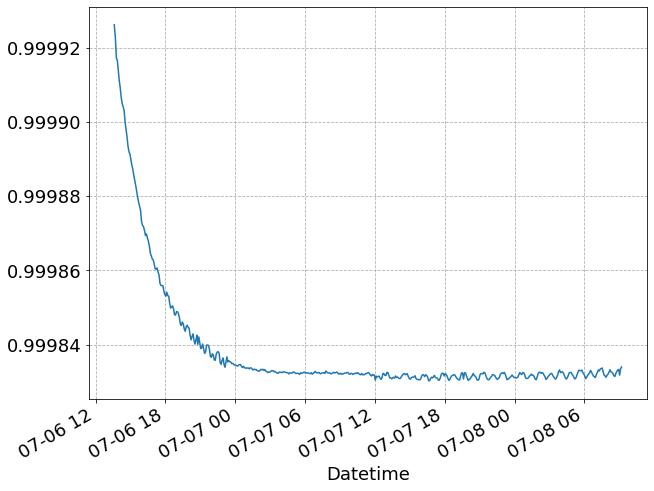

In [224]:
df_temp['NMR [T]'].plot()

In [225]:
df_temp['NMR [T]']

Datetime
2022-07-06 13:36:27    0.999926
2022-07-06 13:37:01    0.999926
2022-07-06 13:42:00    0.999922
2022-07-06 13:47:01    0.999917
2022-07-06 13:52:00    0.999917
                         ...   
2022-07-08 08:52:03    0.999833
2022-07-08 08:57:03    0.999833
2022-07-08 09:02:01    0.999832
2022-07-08 09:07:02    0.999834
2022-07-08 09:12:04    0.999834
Name: NMR [T], Length: 525, dtype: float64

In [226]:
len(df_temp)

525

In [227]:
df_temp.tail()

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-08 08:52:03,7/8/2022 8:52:03 AM,179.684050,21.071350,26.163031,24.618713,7.448544,10.733968,8.025106,11.168760,15.940317,...,10.977219,29.165329,7.411998,17.936218,32.860771,0.999833,0.0,155736.0,43.260000,1.802500
2022-07-08 08:57:03,7/8/2022 8:57:03 AM,179.684163,21.071483,26.167870,24.633305,7.124128,10.510748,7.743465,10.911865,15.944378,...,10.750300,29.968510,7.067007,17.978432,32.856987,0.999833,0.0,156036.0,43.343333,1.805972
2022-07-08 09:02:01,7/8/2022 9:02:01 AM,179.684220,21.073083,26.180363,24.662191,6.739734,10.260991,7.421350,10.605721,15.945044,...,10.514507,30.117489,6.632665,17.893690,32.856987,0.999832,0.0,156334.0,43.426111,1.809421
2022-07-08 09:07:02,7/8/2022 9:07:02 AM,179.683993,21.074667,26.194056,24.667284,6.488379,10.151891,7.270730,10.416482,15.945613,...,10.502700,30.717493,6.320962,17.997566,32.867828,0.999834,0.0,156635.0,43.509722,1.812905
2022-07-08 09:12:04,7/8/2022 9:12:04 AM,179.684163,21.077117,26.209244,24.663843,6.418888,10.258974,7.271063,10.386641,15.935767,...,10.919797,31.082924,5.997125,18.110905,32.857616,0.999834,0.0,156937.0,43.593611,1.816400


In [228]:
df = load_data(scanfile).iloc[1:]

In [229]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],2F0000000D5EC73A_Raw_X,2F0000000D5EC73A_Raw_Y,2F0000000D5EC73A_Raw_Z,2F0000000D5EC73A_Raw_T,2F0000000D5EC73A_Cal_X,...,2F0000000D5EC73A_Cal_T,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-06 16:03:46,7/6/2022 4:03:46 PM,179.683880,21.069733,0.0,0.0,-84752.0,-388034.0,-2763059.0,15972.0,0.988052,...,15.972,-8.0,-180.0,350.113973,-1.0,179.999985,-1.0,44.0,0.012222,0.000509
2022-07-06 16:03:54,7/6/2022 4:03:54 PM,179.683880,21.069833,0.0,0.0,-97392.0,-383432.0,-2763112.0,15974.0,0.988013,...,15.974,-8.0,-178.0,350.113902,-1.0,182.000010,-1.0,52.0,0.014444,0.000602
2022-07-06 16:04:02,7/6/2022 4:04:02 PM,179.683880,21.069967,0.0,0.0,-109801.0,-378261.0,-2763330.0,15986.0,0.988033,...,15.986,-8.0,-176.0,350.113886,-1.0,184.000014,-1.0,60.0,0.016667,0.000694
2022-07-06 16:04:10,7/6/2022 4:04:10 PM,179.683880,21.070233,0.0,0.0,-122130.0,-372866.0,-2763386.0,15997.0,0.987995,...,15.997,-8.0,-174.0,350.113859,-1.0,186.000012,-1.0,68.0,0.018889,0.000787
2022-07-06 16:04:18,7/6/2022 4:04:18 PM,179.683880,21.070600,0.0,0.0,-134145.0,-366835.0,-2763557.0,16001.0,0.987992,...,16.001,-8.0,-172.0,350.113848,-1.0,188.000015,-1.0,76.0,0.021111,0.000880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-06 23:20:13,7/6/2022 11:20:13 PM,179.684163,21.079600,0.0,0.0,148848.0,330998.0,-2783782.0,16082.0,0.992093,...,16.082,8.0,172.0,5.999965,0.0,171.999992,0.0,26231.0,7.286389,0.303600
2022-07-06 23:20:21,7/6/2022 11:20:21 PM,179.684050,21.080083,0.0,0.0,160976.0,326104.0,-2783635.0,16077.0,0.992095,...,16.077,8.0,174.0,6.000025,0.0,174.000011,0.0,26239.0,7.288611,0.303692
2022-07-06 23:20:28,7/6/2022 11:20:28 PM,179.683993,21.080533,0.0,0.0,173051.0,320787.0,-2783548.0,16095.0,0.992130,...,16.095,8.0,176.0,6.000010,0.0,176.000011,0.0,26246.0,7.290556,0.303773


<AxesSubplot:xlabel='Datetime'>

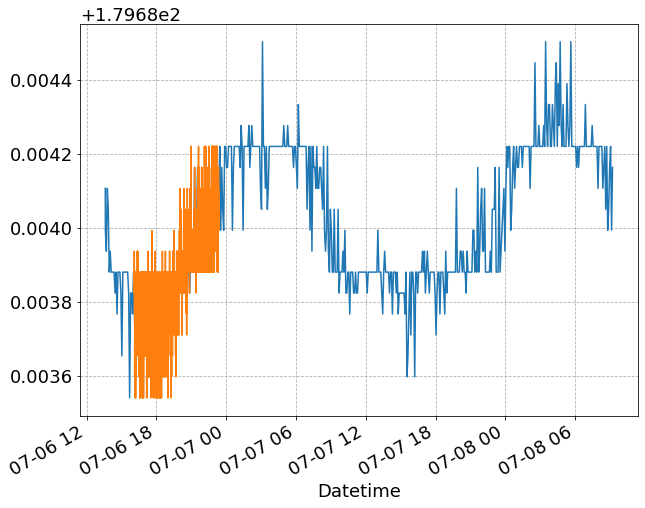

In [230]:
df_temp['Magnet Current [A]'].plot()
df['Magnet Current [A]'].plot()

In [231]:
df.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'NMR [T]',
       'NMR [FFT]', '2F0000000D5EC73A_Raw_X', '2F0000000D5EC73A_Raw_Y',
       '2F0000000D5EC73A_Raw_Z', '2F0000000D5EC73A_Raw_T',
       '2F0000000D5EC73A_Cal_X', '2F0000000D5EC73A_Cal_Y',
       '2F0000000D5EC73A_Cal_Z', '2F0000000D5EC73A_Cal_T',
       'SmarAct_Pattern_Angle_1', 'SmarAct_Pattern_Angle_2',
       'SmarAct_Meas_Angle_1', 'SmarAct_Meas_Rotation_Angle_1',
       'SmarAct_Meas_Angle_2', 'SmarAct_Meas_Rotation_Angle_2',
       'seconds_delta', 'hours_delta', 'days_delta'],
      dtype='object')

In [232]:
def get_probe_IDs(df):
    probes = [c[:-6] for c in df.columns if "Raw_X" in c]
    return sorted(probes)

In [233]:
probes = get_probe_IDs(df)
probe = probes[0]

In [234]:
probes, probe

(['2F0000000D5EC73A'], '2F0000000D5EC73A')

In [235]:
# Hall probe calculations
for p in probes:
    for t in ['Raw', 'Cal']:
        df[f'{p}_{t}_Bmag'] = (df[f'{p}_{t}_X']**2 + df[f'{p}_{t}_Y']**2 + df[f'{p}_{t}_Z']**2)**(1/2)
        df[f'{p}_{t}_Theta'] = np.arccos(df[f'{p}_{t}_Z']/df[f'{p}_{t}_Bmag'])
        df[f'{p}_{t}_Phi'] = np.arctan2(df[f'{p}_{t}_Y'],df[f'{p}_{t}_X'])
# again using theta redefining Cal components
for p in probes:
    for t in ['Cal']:
        df[f'{p}_{t}_Theta2'] = np.arccos(df[f'{p}_{t}_X']/df[f'{p}_{t}_Bmag'])
        df[f'{p}_{t}_Phi2'] = np.arctan2(df[f'{p}_{t}_Z'],df[f'{p}_{t}_Y'])

In [236]:
df['Magnet Resistance [Ohm]'] = df['Magnet Voltage [V]'] / df['Magnet Current [A]']
df['Coil Resistance [Ohm]'] = 2*df['Magnet Resistance [Ohm]']
df['Magnet Power [W]'] = df['Magnet Voltage [V]'] * df['Magnet Current [A]']

In [237]:
df[['Magnet Power [W]', 'Coil Resistance [Ohm]']]

,Magnet Power [W],Coil Resistance [Ohm]
Datetime,,
2022-07-06 16:03:46,3785.891436,0.234520
2022-07-06 16:03:54,3785.909404,0.234521
2022-07-06 16:04:02,3785.933362,0.234523
2022-07-06 16:04:10,3785.981278,0.234526
2022-07-06 16:04:18,3786.047162,0.234530
...,...,...
2022-07-06 23:20:13,3787.670289,0.234629
2022-07-06 23:20:21,3787.754748,0.234635
2022-07-06 23:20:28,3787.834411,0.234640


In [238]:
t0 = df.index[0]
tf = df.index[-1]

In [239]:
t0, tf

(Timestamp('2022-07-06 16:03:46'), Timestamp('2022-07-06 23:20:44'))

In [240]:
df_t = df_temp.query(f'"{t0}" <= Datetime <= "{tf}"').copy()

In [241]:
df_t

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-06 16:07:01,7/6/2022 4:07:01 PM,179.683767,21.074883,26.187641,24.667658,6.319886,9.961797,7.099402,10.286974,15.275215,...,10.654795,31.292187,6.034691,18.261675,32.463352,0.999872,0.0,9034.0,2.509444,0.104560
2022-07-06 16:12:02,7/6/2022 4:12:02 PM,179.683653,21.076400,26.172749,24.689800,6.855628,10.473699,7.495399,10.725371,15.290393,...,11.357689,31.561775,6.000782,18.402285,32.481129,0.999871,0.0,9335.0,2.593056,0.108044
2022-07-06 16:17:03,7/6/2022 4:17:03 PM,179.683710,21.077750,26.170959,24.672358,7.828949,11.179749,8.392993,11.519891,15.312061,...,12.008971,32.361000,6.918027,18.506609,32.485329,0.999869,0.0,9636.0,2.676667,0.111528
2022-07-06 16:22:02,7/6/2022 4:22:02 PM,179.683880,21.076100,26.144972,24.659733,8.545756,11.614676,8.999782,12.037946,15.325926,...,12.115820,32.640175,7.886259,18.155928,32.472282,0.999870,0.0,9935.0,2.759722,0.114988
2022-07-06 16:27:03,7/6/2022 4:27:03 PM,179.683823,21.073667,26.116583,24.613954,8.603431,11.535717,8.989681,12.033832,15.339554,...,11.841595,34.324974,8.537909,18.151688,32.471493,0.999869,0.0,10236.0,2.843333,0.118472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-06 22:57:03,7/6/2022 10:57:03 PM,179.684050,21.074450,26.162067,24.666576,8.178459,11.216433,8.568126,11.695870,15.849175,...,11.509137,28.351236,8.130361,17.582279,32.592434,0.999836,0.0,33636.0,9.343333,0.389306
2022-07-06 23:02:03,7/6/2022 11:02:03 PM,179.684163,21.073200,26.147450,24.676094,7.826425,10.940791,8.250216,11.424167,15.852745,...,11.222661,28.897053,7.773224,17.514504,32.599178,0.999835,0.0,33936.0,9.426667,0.392778
2022-07-06 23:07:03,7/6/2022 11:07:03 PM,179.684220,21.073067,26.154867,24.667540,7.468792,10.666583,7.990472,11.159790,15.850078,...,11.005773,28.042417,7.420802,17.453478,32.651154,0.999834,0.0,34236.0,9.510000,0.396250


In [242]:
df_t['NMR [T]']

Datetime
2022-07-06 16:07:01    0.999872
2022-07-06 16:12:02    0.999871
2022-07-06 16:17:03    0.999869
2022-07-06 16:22:02    0.999870
2022-07-06 16:27:03    0.999869
                         ...   
2022-07-06 22:57:03    0.999836
2022-07-06 23:02:03    0.999835
2022-07-06 23:07:03    0.999834
2022-07-06 23:12:03    0.999835
2022-07-06 23:17:03    0.999837
Name: NMR [T], Length: 87, dtype: float64

In [243]:
len(df_t), len(df_temp)

(87, 525)

# Basic Plotting
- All variables vs. time
- Look at relationship between SmarAct motors and measured angles.

/tmp/ipykernel_891194/2936248105.py:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



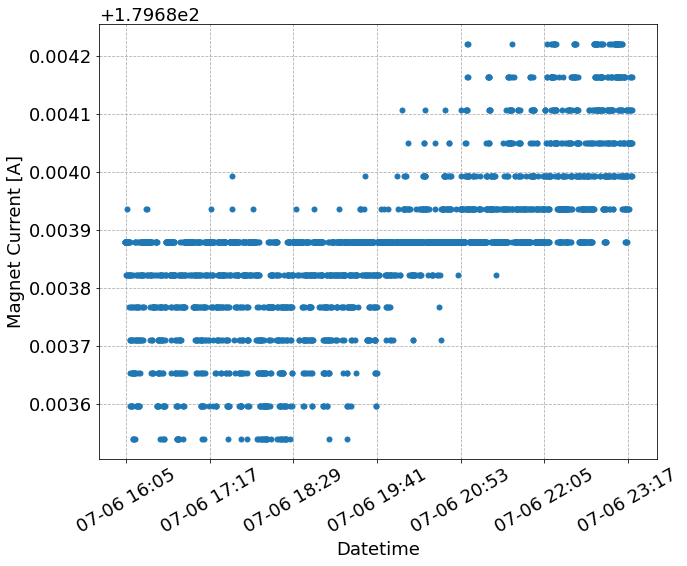

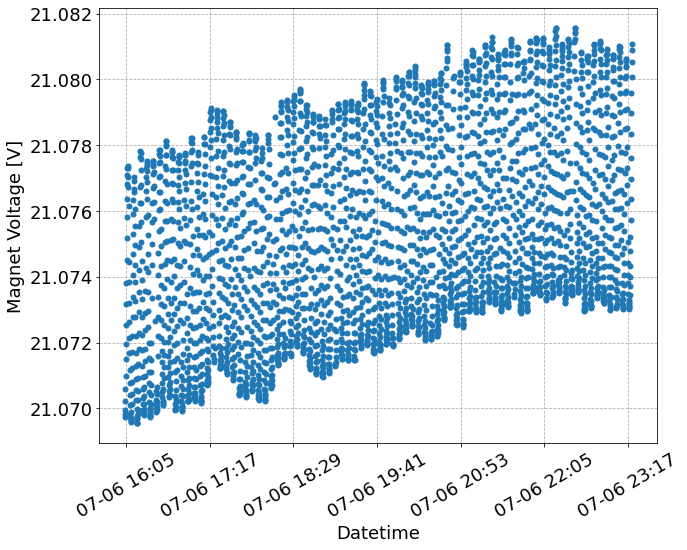

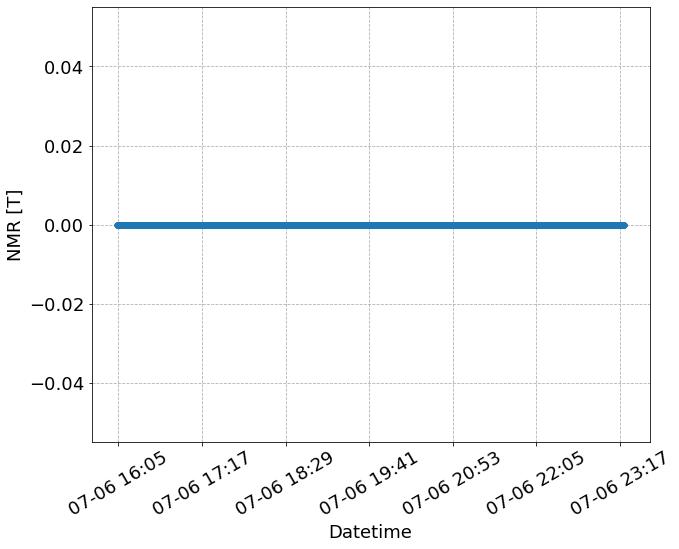

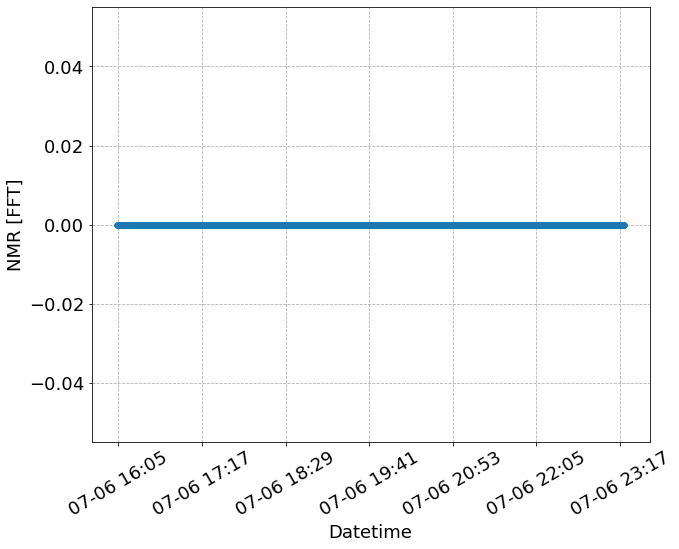

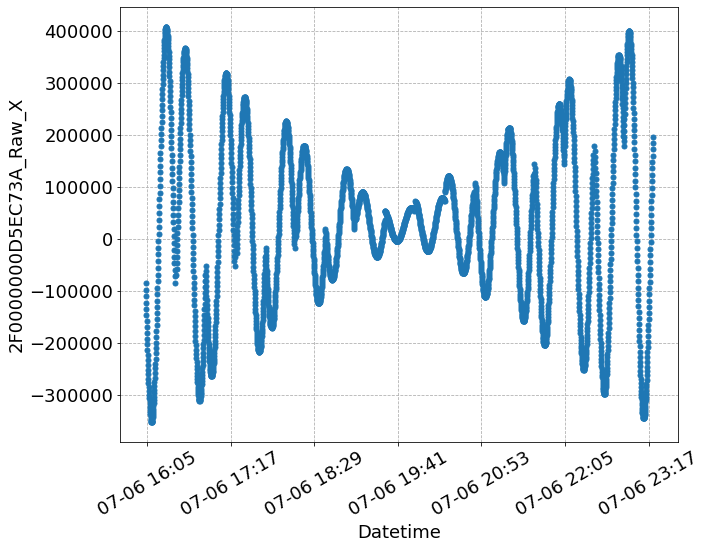

...

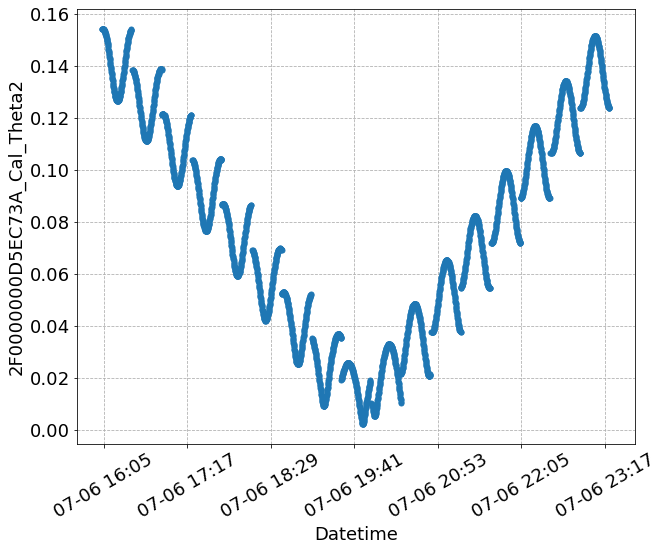

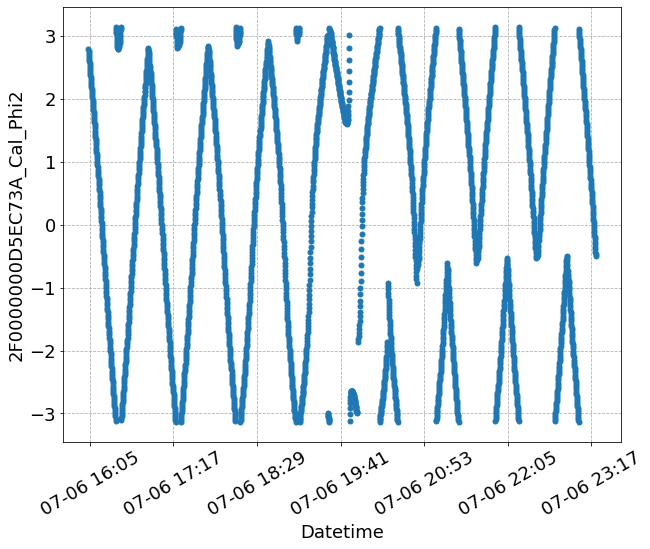

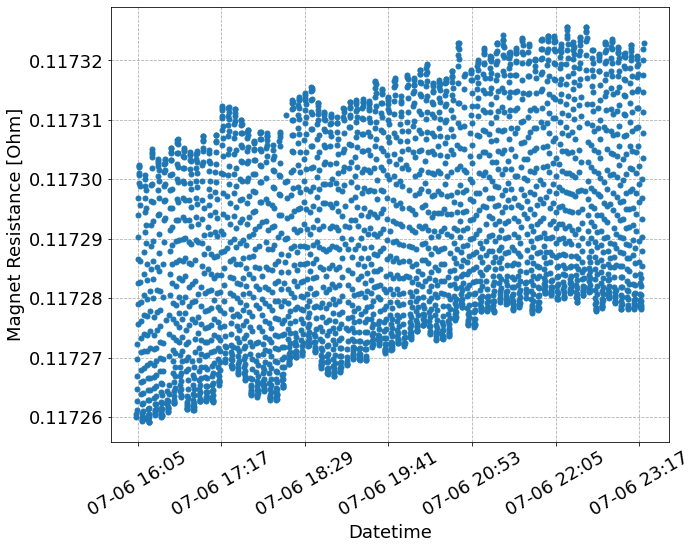

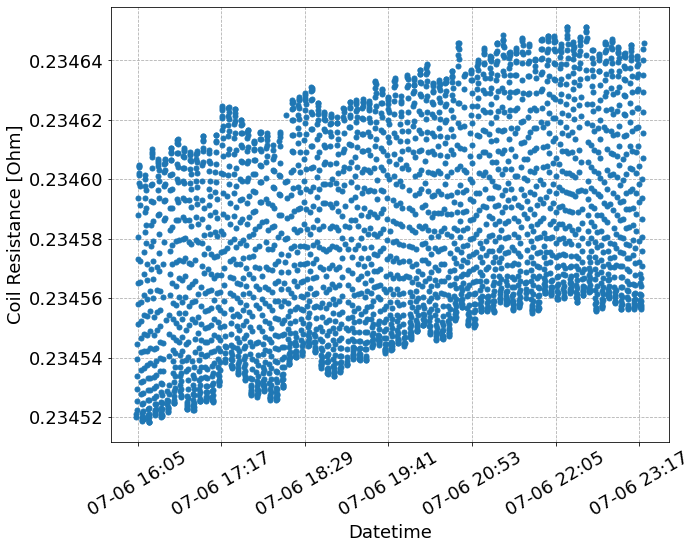

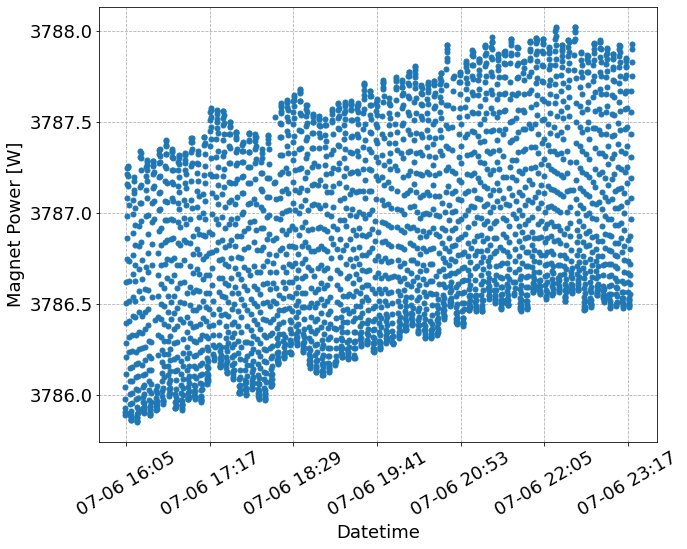

In [244]:
# plot vs. time
for col in df.columns:
    if is_numeric_dtype(df[col]):
        fig, ax = plt.subplots()
        ax = datetime_plt(ax, df.index, df[col], nmaj=6, Locator='Minute')
        ax.set_xlabel('Datetime')
        ax.set_ylabel(col)

/tmp/ipykernel_891194/1916587146.py:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



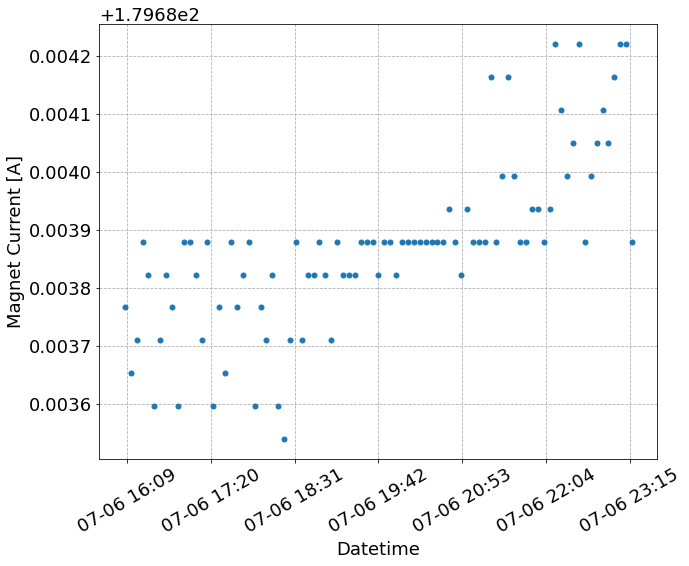

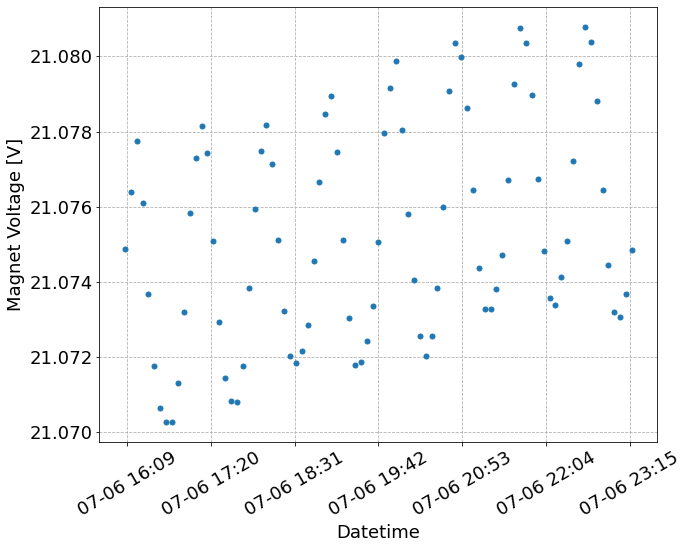

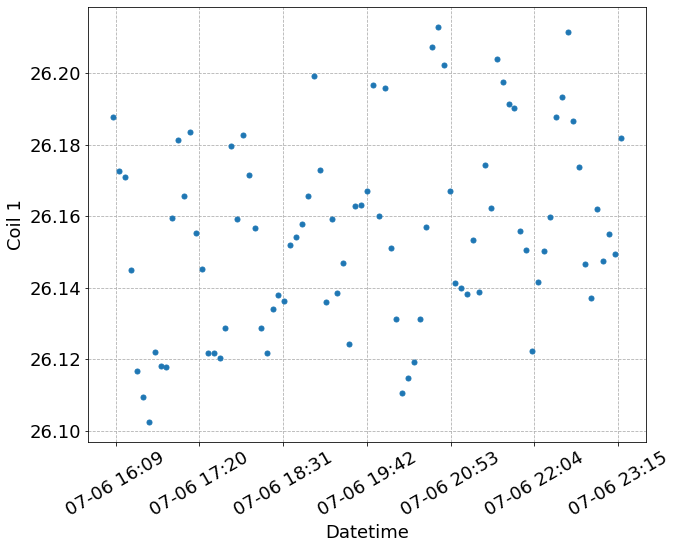

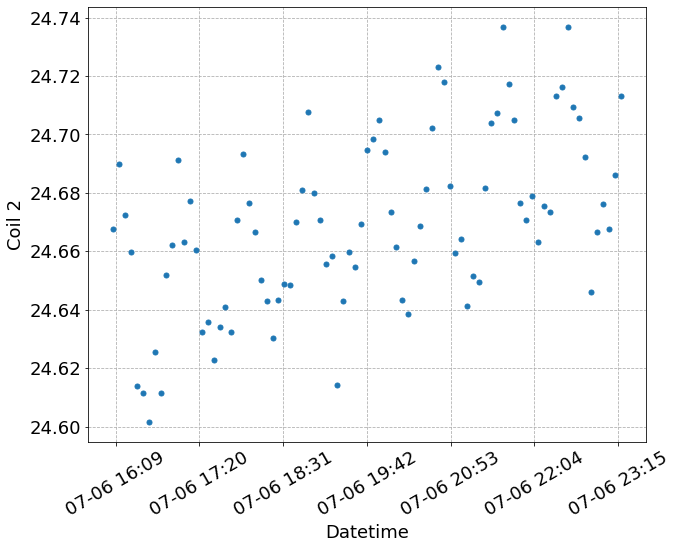

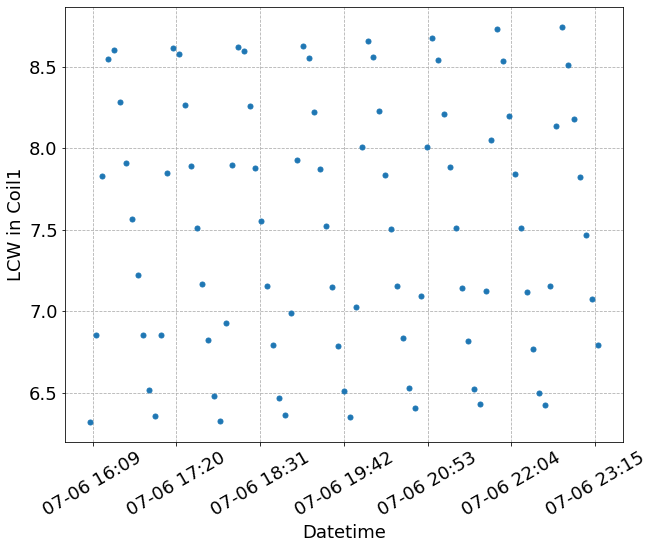

...

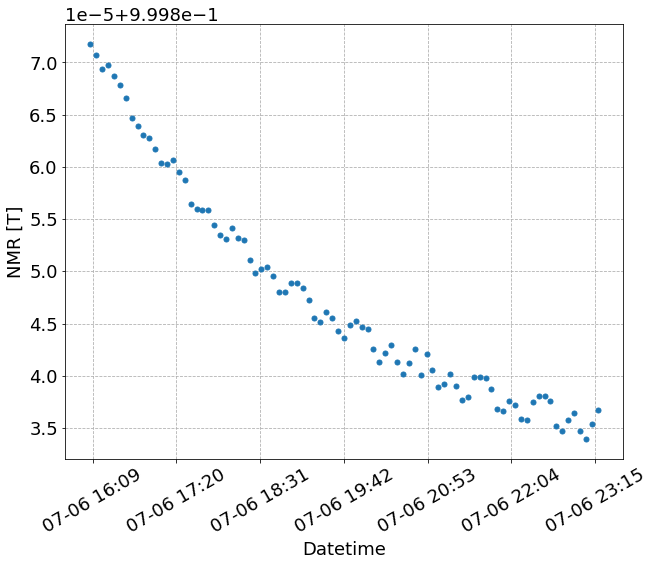

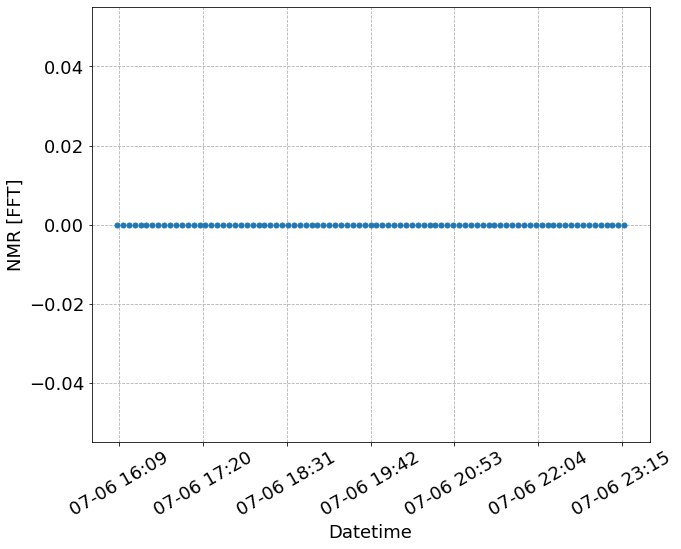

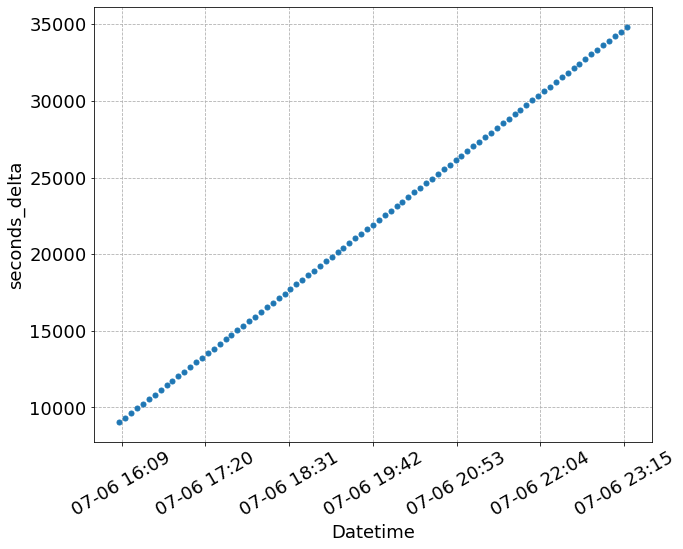

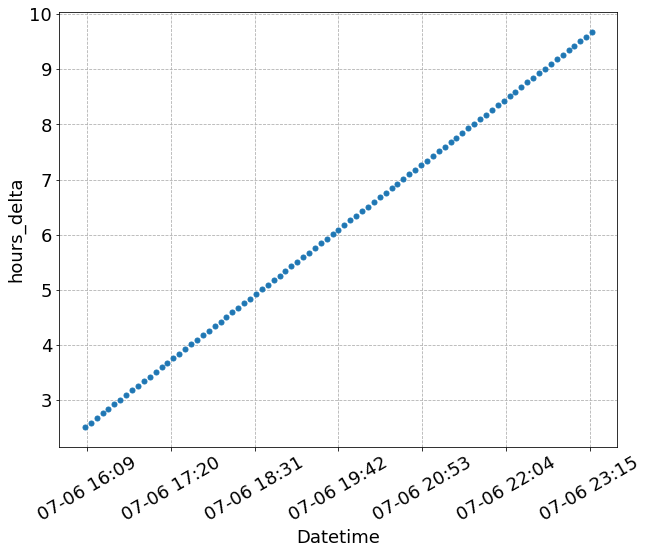

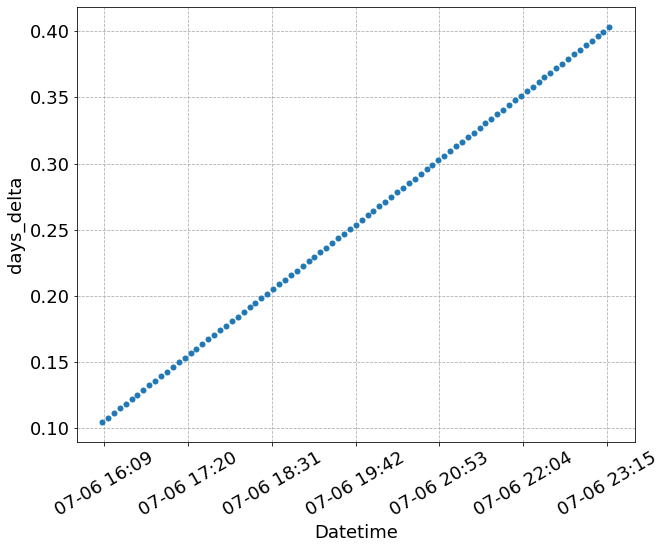

In [245]:
# plot vs. time
for col in df_t.columns:
    if is_numeric_dtype(df_t[col]):
        fig, ax = plt.subplots()
        ax = datetime_plt(ax, df_t.index, df_t[col], nmaj=6, Locator='Minute')
        ax.set_xlabel('Datetime')
        ax.set_ylabel(col)

In [246]:
# looking at angles in HP and SmarAct

In [247]:
# a1 = df['SmarAct_Meas_Angle_1'].values * np.pi / 180.
# a2 = df['SmarAct_Meas_Angle_2'].values * np.pi / 180.
# center around 0
a1 = df['SmarAct_Meas_Angle_1'].values * np.pi / 180.
a2 = df['SmarAct_Meas_Angle_2'].values * np.pi / 180.
a1[a1>np.pi] = a1[a1>np.pi]-2*np.pi
a2[a2>np.pi] = a2[a2>np.pi]-2*np.pi

In [248]:
r_th = df[f'{probe}_Raw_Theta'].values
r_ph = df[f'{probe}_Raw_Phi'].values
c_th = df[f'{probe}_Cal_Theta'].values
c_ph = df[f'{probe}_Cal_Phi'].values
c_th2 = df[f'{probe}_Cal_Theta2'].values
c_ph2 = df[f'{probe}_Cal_Phi2'].values

In [249]:
len(a1), len(r_th)

(3077, 3077)

In [250]:
# raw

In [251]:
df[f'{probe}_Raw_Theta'].describe()

count    3077.000000
mean        3.066664
std         0.040448
min         2.989001
25%         3.031239
50%         3.066959
75%         3.102173
max         3.140044
Name: 2F0000000D5EC73A_Raw_Theta, dtype: float64

In [252]:
df[f'{probe}_Raw_Theta'].max() - df[f'{probe}_Raw_Theta'].min()

0.15104251398459123

In [253]:
np.degrees(0.14787)

8.472326916599483

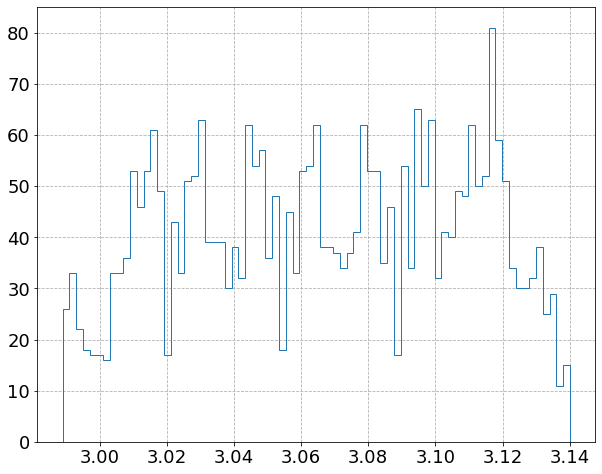

In [254]:
fig, ax = plt.subplots()
ax.hist(df[f'{probe}_Raw_Theta'], bins=75, histtype='step');

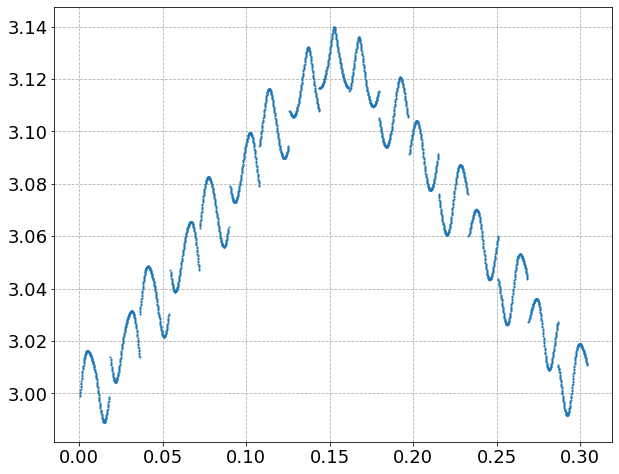

In [255]:
fig, ax = plt.subplots()
#ax.hist(df_[f'{probe}_Raw_Theta'], bins=75, histtype='step');
ax.scatter(df['days_delta'], df[f'{probe}_Raw_Theta'], s=1);

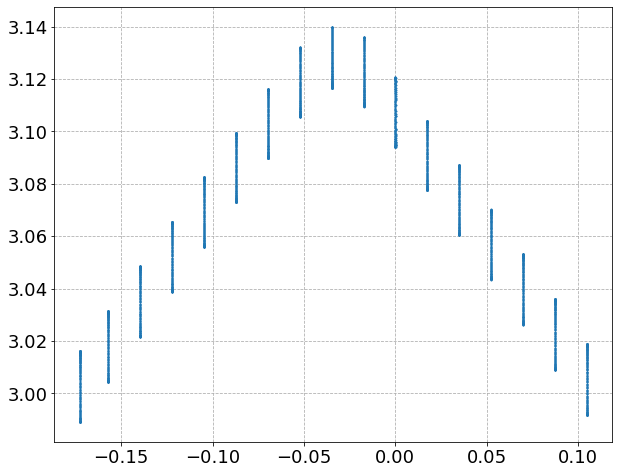

In [256]:
fig, ax = plt.subplots()
ax.scatter(a1, r_th, s=1);
# ax.scatter(a2, r_th, s=1);

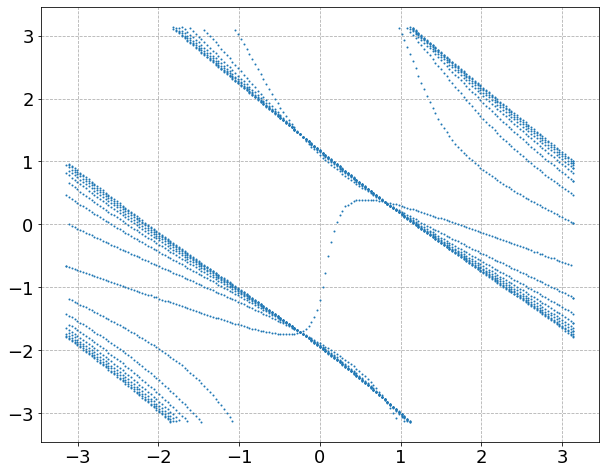

In [257]:
fig, ax = plt.subplots()
#ax.scatter(a2, r_ph, s=1);
ax.scatter(a2, r_ph, s=1);

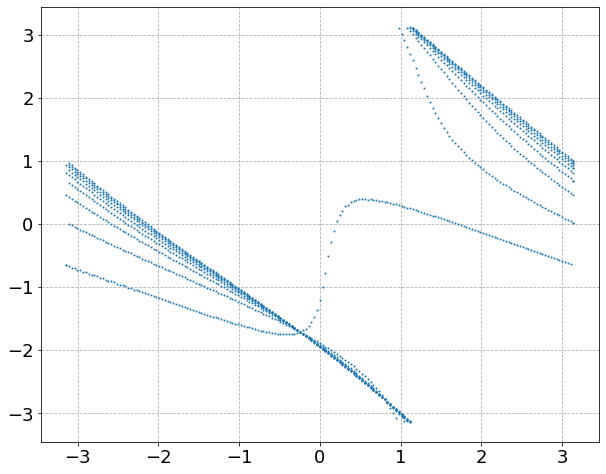

In [258]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
#ax.scatter(a2, r_ph, s=1);
ax.scatter(a2[a1 > -0.036], r_ph[a1 > -0.036], s=1);

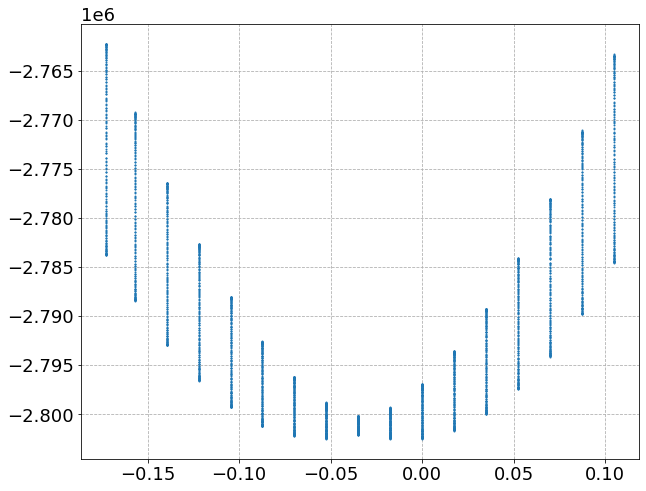

In [259]:
fig, ax = plt.subplots()
ax.scatter(a1, df[f'{probe}_Raw_Z'], s=1);
# ax.scatter(a2, r_th, s=1);

In [260]:
# cal

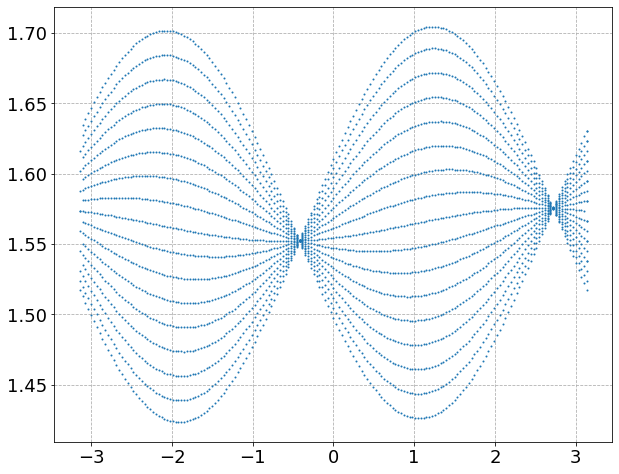

In [261]:
fig, ax = plt.subplots()
# ax.scatter(a1, c_th, s=1);
ax.scatter(a2, c_th, s=1);

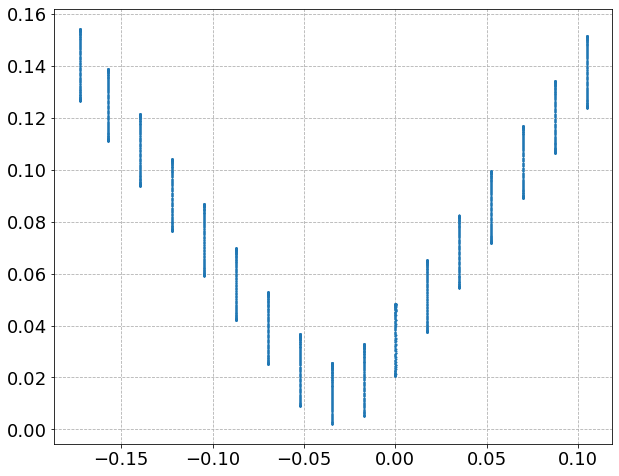

In [262]:
fig, ax = plt.subplots()
# ax.scatter(a1, c_th, s=1);
ax.scatter(a1, c_th2, s=1);

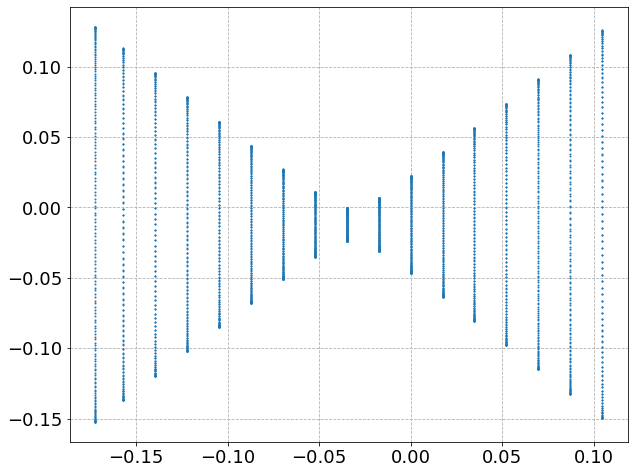

In [263]:
fig, ax = plt.subplots()
# ax.scatter(a2, c_ph, s=1);
ax.scatter(a1, c_ph, s=1);

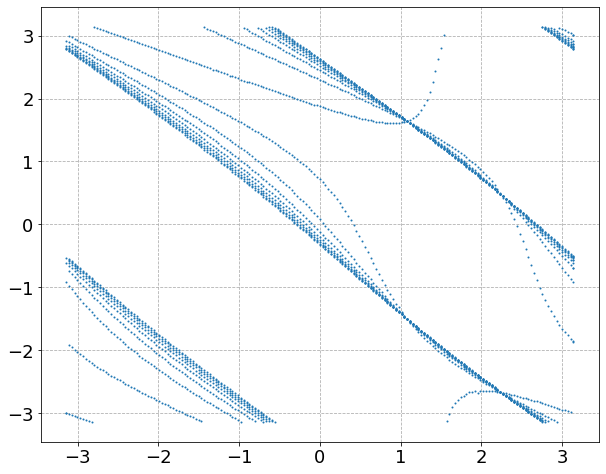

In [264]:
fig, ax = plt.subplots()
# ax.scatter(a2, c_ph, s=1);
ax.scatter(a2, c_ph2, s=1);

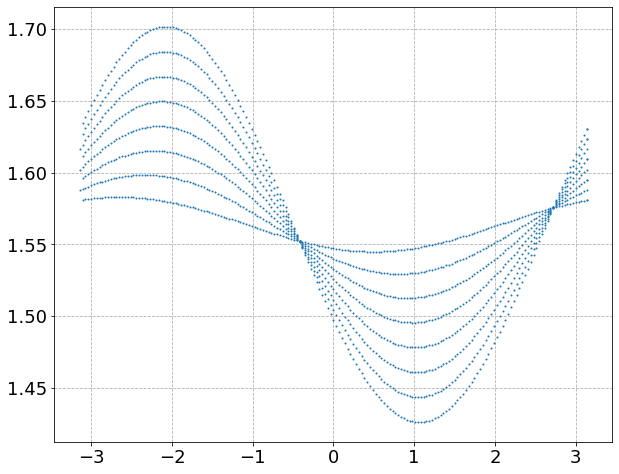

In [265]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_th[a1 > -0.034], s=1);

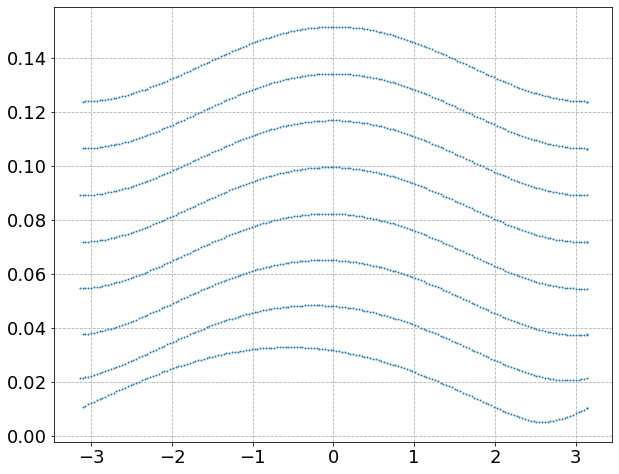

In [266]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_th2[a1 > -0.034], s=1);

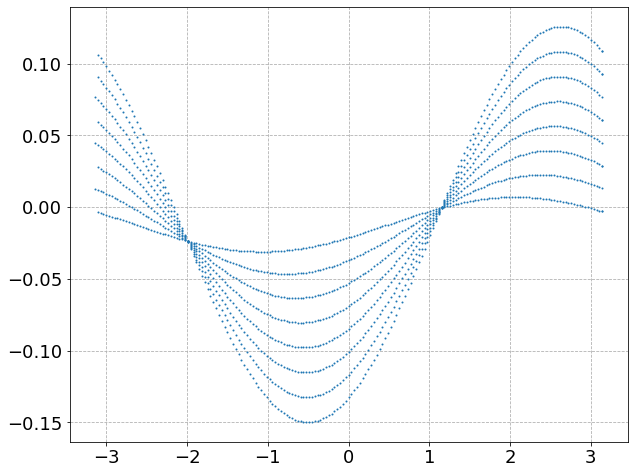

In [267]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_ph[a1 > -0.034], s=1);

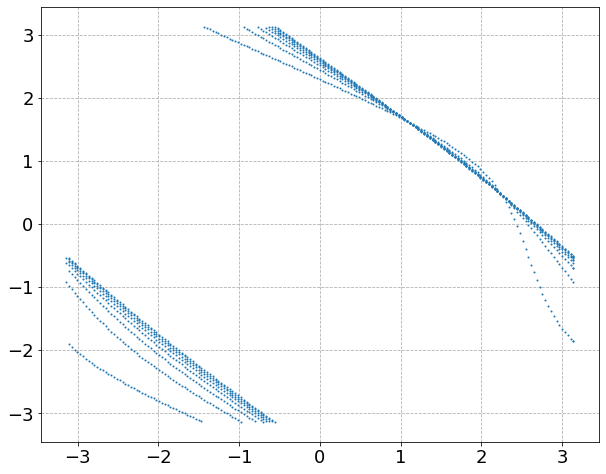

In [268]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_ph2[a1 > -0.034], s=1);

# Hall B Angles vs. Both SmarAct Motors
- 3D plot (i.e. scatter or surface if possible) may reveal how much of each motor in particular angle

## 2D Scatter, with color

In [269]:
a1[np.argmax(r_th)], a2[np.argmax(r_th)]

(-0.03490644541354726, 0.06981320498635823)

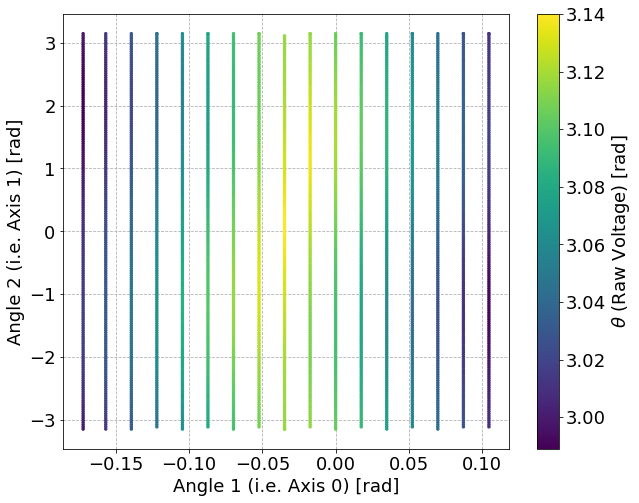

In [270]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=r_th, s=6);
cb = fig.colorbar(sc, label=r'$\theta$ (Raw Voltage) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

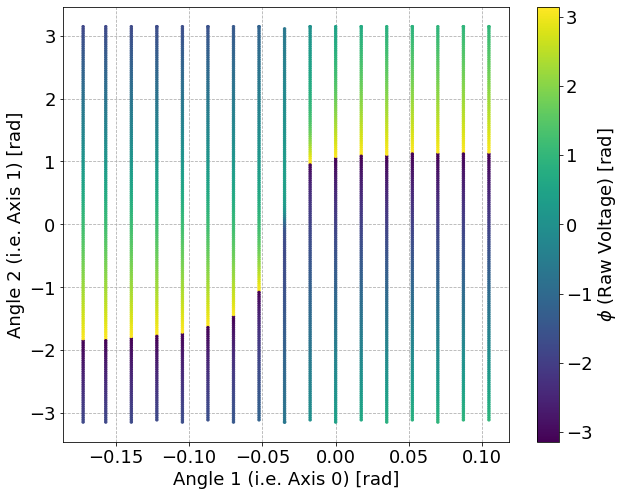

In [271]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=r_ph, s=6);
cb = fig.colorbar(sc, label=r'$\phi$ (Raw Voltage) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [272]:
len(np.unique(np.round(a1, 3)))

17

In [273]:
np.unique(np.round(a1, 3))

array([-0.173, -0.157, -0.14 , -0.122, -0.105, -0.087, -0.07 , -0.052,
       -0.035, -0.017, -0.   ,  0.017,  0.035,  0.052,  0.07 ,  0.087,
        0.105])

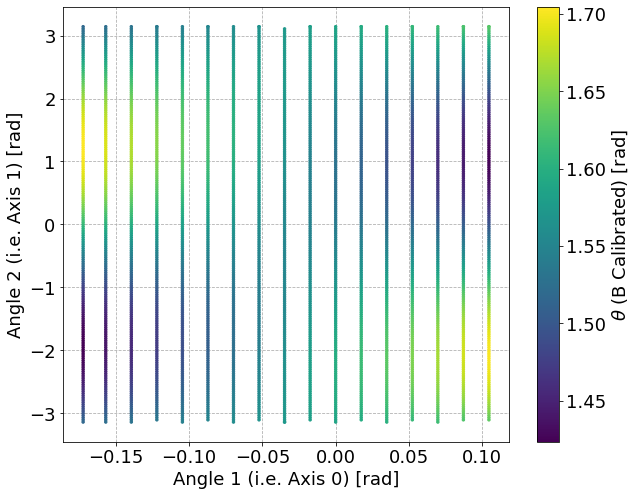

In [274]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_th, s=6);
cb = fig.colorbar(sc, label=r'$\theta$ (B Calibrated) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

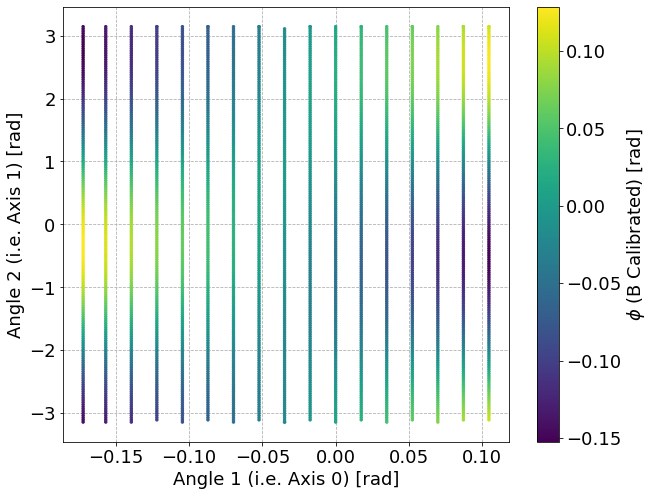

In [275]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_ph, s=6);
cb = fig.colorbar(sc, label=r'$\phi$ (B Calibrated) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

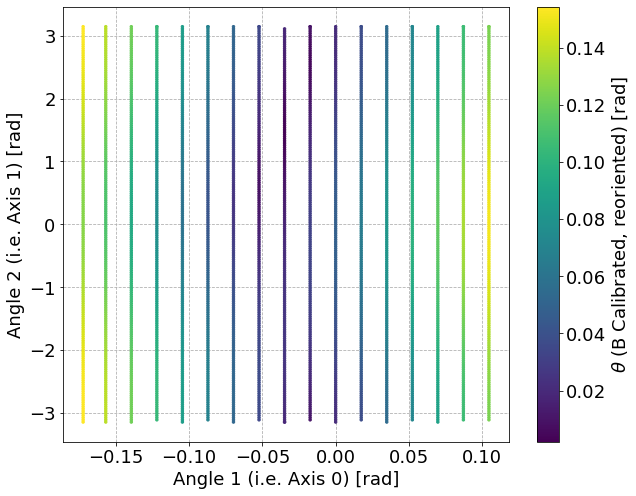

In [276]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_th2, s=6);
cb = fig.colorbar(sc, label=r'$\theta$ (B Calibrated, reoriented) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

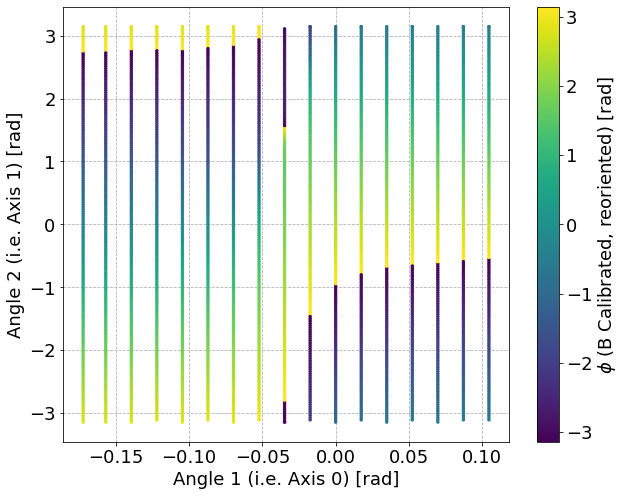

In [277]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_ph2, s=6);
cb = fig.colorbar(sc, label=r'$\phi$ (B Calibrated, reoriented) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

# Spherical Harmonics

In [278]:
fig = spherical_scatter3d([df['SmarAct_Meas_Angle_2']], [df['SmarAct_Meas_Angle_1']+2.0], [df[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=True, title=None, filename=None)

# Look at a single Hall element (Voltage)

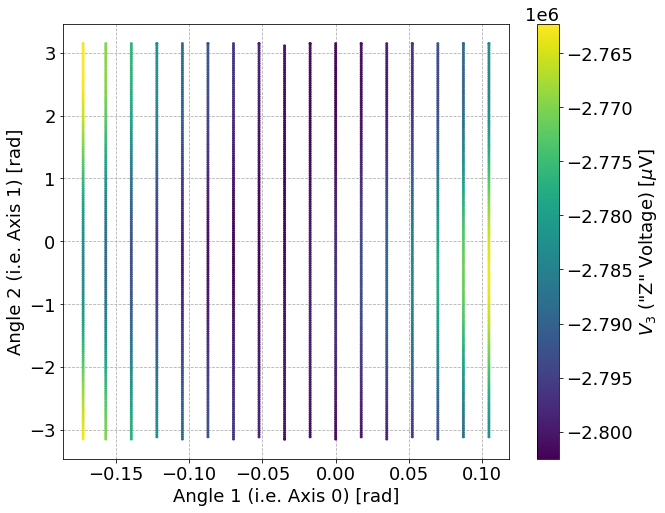

In [421]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=df[f'{probe}_Raw_Z'], s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

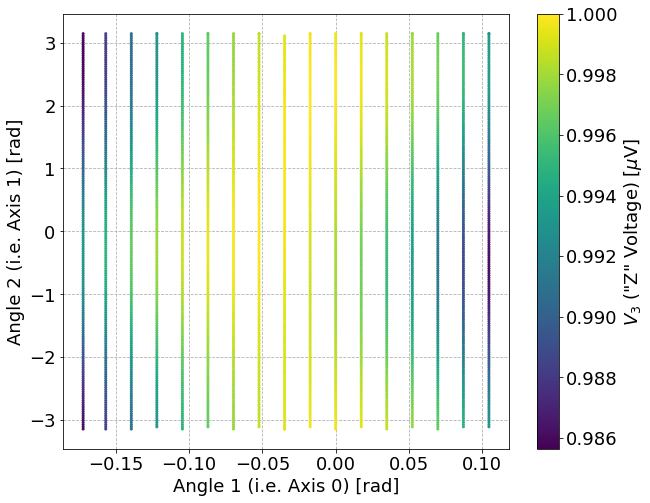

In [422]:
# scaled
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=df[f'{probe}_Raw_Z'] / df[f'{probe}_Raw_Z'].min(), s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [285]:
df[f'{probe}_Raw_Z'].abs().max(), df[f'{probe}_Raw_Z'].abs().min()

(2802521.0, 2762270.0)

- Notice negative slope appears to give cosine (I am guessing)
    - axis 1 / axis 0 $\approx -3.5 / 0.277 = -12.635$

In [280]:
np.max(a1), np.min(a1), np.max(a1) - np.min(a1)

(0.10472064523757828, -0.17255276189658364, 0.27727340713416193)

In [286]:
-3.5 / 0.277

-12.63537906137184

# Function to Parameterize Orientations

## v1
- $\theta, \phi$ parameterize normal vector of a single Hall element
- $\alpha, \beta$ parameterize normal vector of $\vec{B}$
- Assume axis 0 and axis 1 are orthogonal.

### Voltage Function

In [440]:
def Hall_Voltage_gen_v1(axis0, axis1, **params):
    Vmax = params['Vmax']
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=False) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    frac_B = np.dot(norm_B_rot, norm_Hall)
    V_meas = Vmax * frac_B
    if params['verbose'] == 1.:
        return V_meas, norm_Hall, norm_B, norm_B_rot, frac_B
    else:
        return V_meas

In [441]:
# B aligned perfectly with Kinematic plate
params = {
    'Vmax': 2802521.0, # ~2e6
    'verbose': 0,
    'theta': np.pi - np.radians(5.),
    #'phi': np.radians(45.),
#     'phi': np.radians(0.),
    'phi': np.radians(180.),
    'alpha': 0.,
    'beta': 0.
}

In [442]:
ax0s = np.unique(np.round(a1, 3))
ax1s = np.unique(np.round(a2, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [443]:
#A0.flatten()

#181 * 17

#len(df)

#Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

#%timeit Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

#Vs

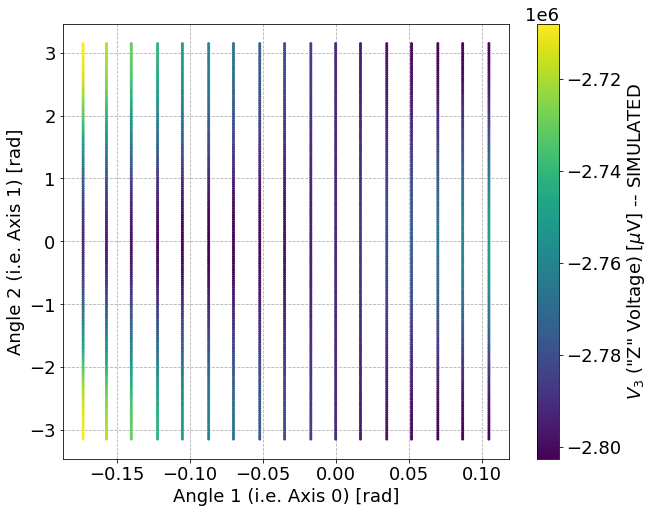

In [444]:
Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

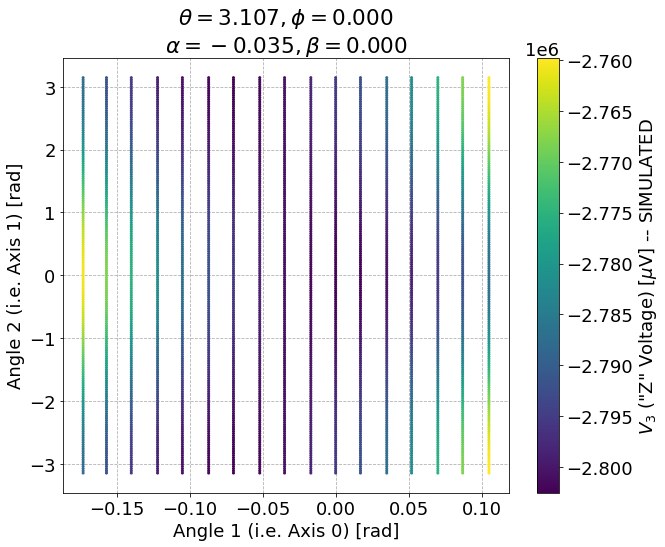

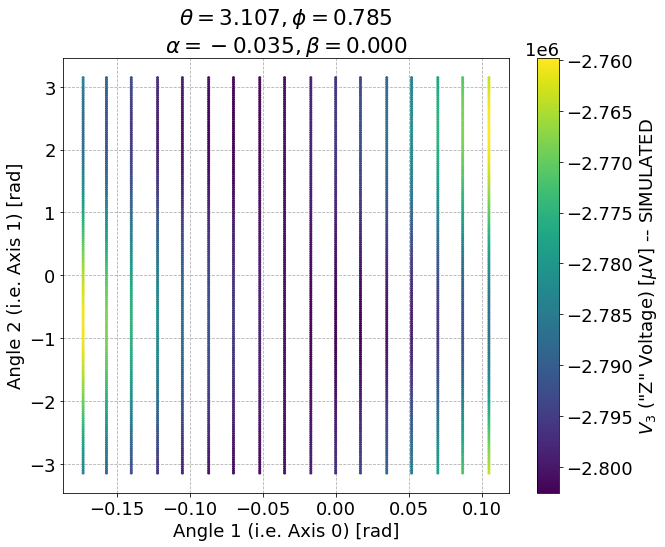

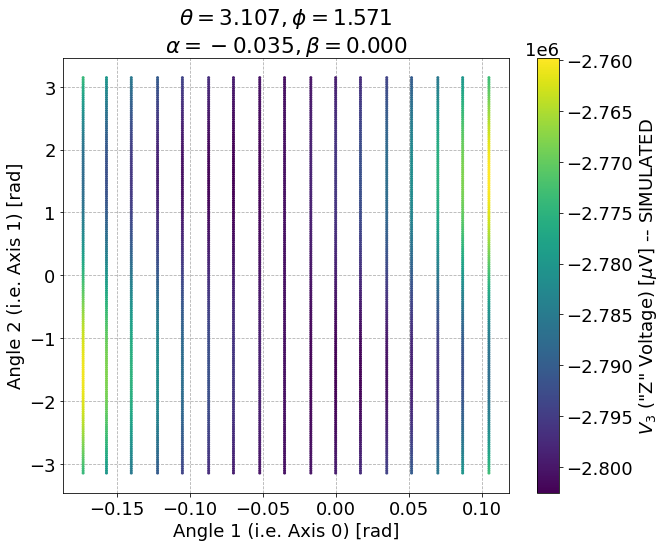

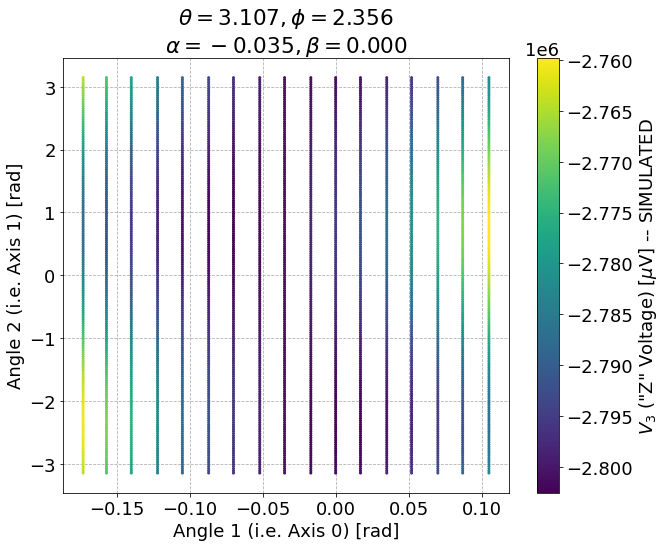

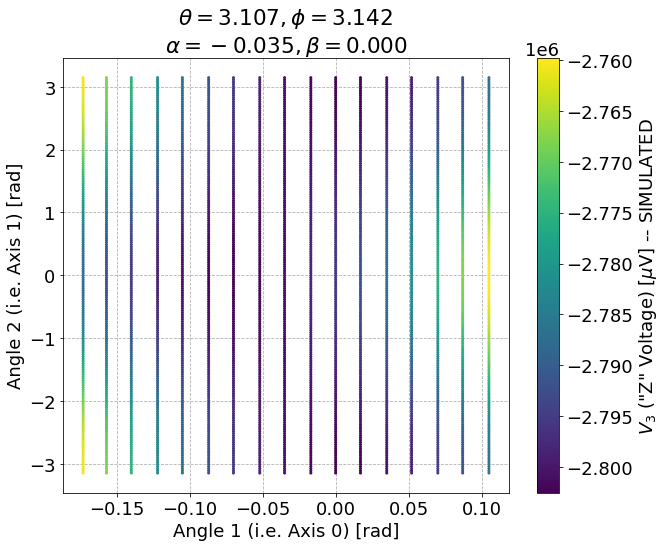

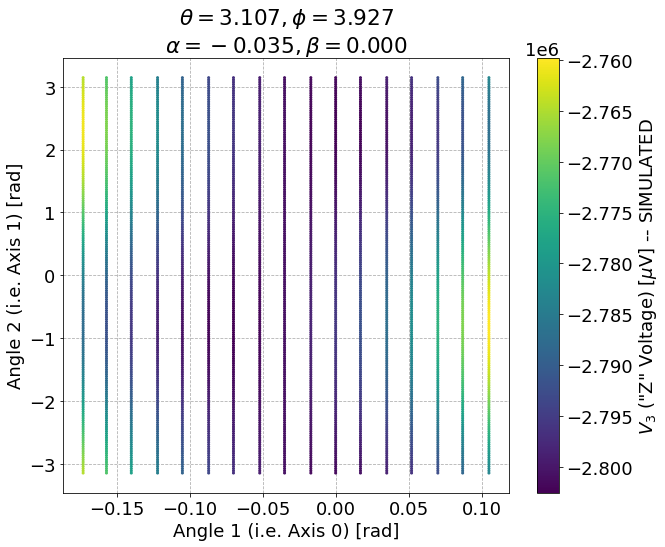

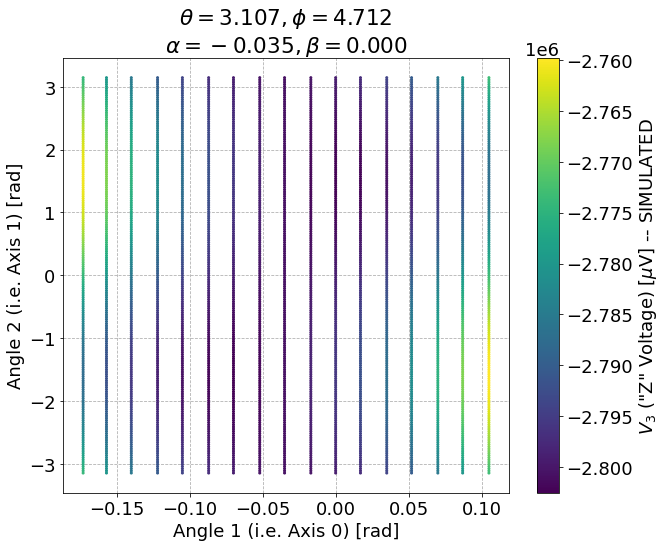

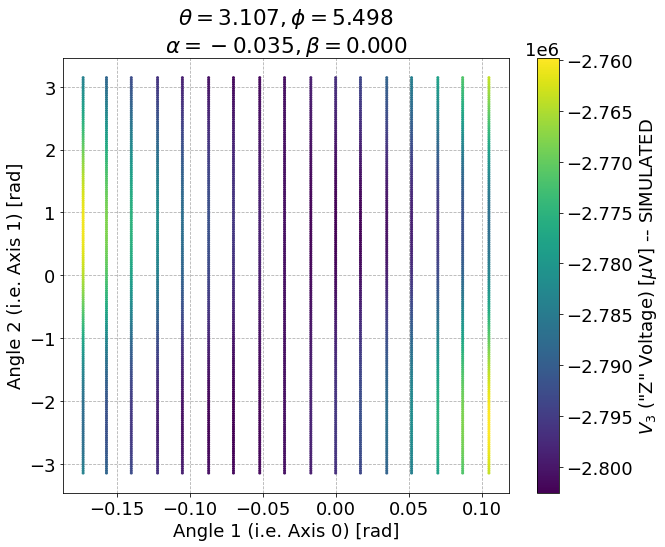

In [445]:
# B aligned perfectly with Kinematic plate
# does phi change anything, or is it only theta that matters?
phis = np.arange(0., 360., 45.)
# phis = [0., 45., 60., 90., 1]
for phi in phis:
    params = {
        'Vmax': 2802521.0, # ~2e6
        'verbose': 0,
        'theta': np.pi - np.radians(2.),
#         'theta': np.pi,
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.radians(phi),
        'alpha': np.radians(-2.),
        'beta': 0.
    }
    ax0s = np.unique(np.round(a1, 3))
    ax1s = np.unique(np.round(a2, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
    Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
    cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

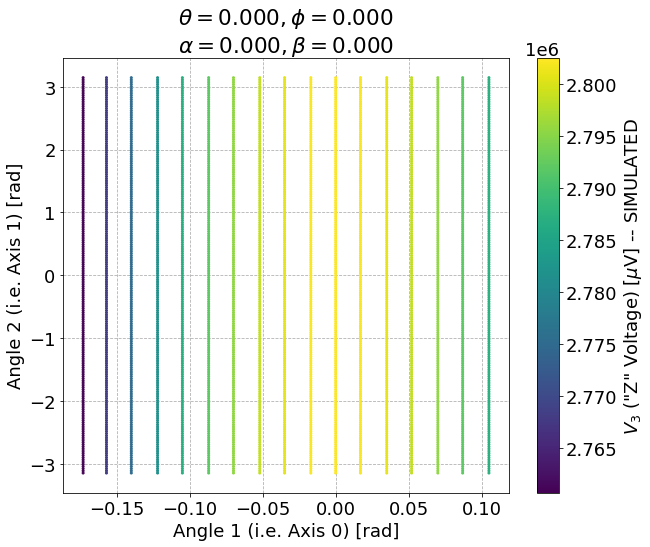

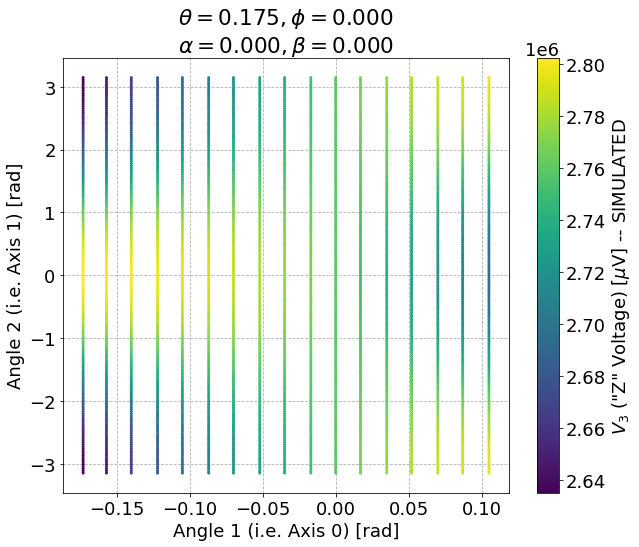

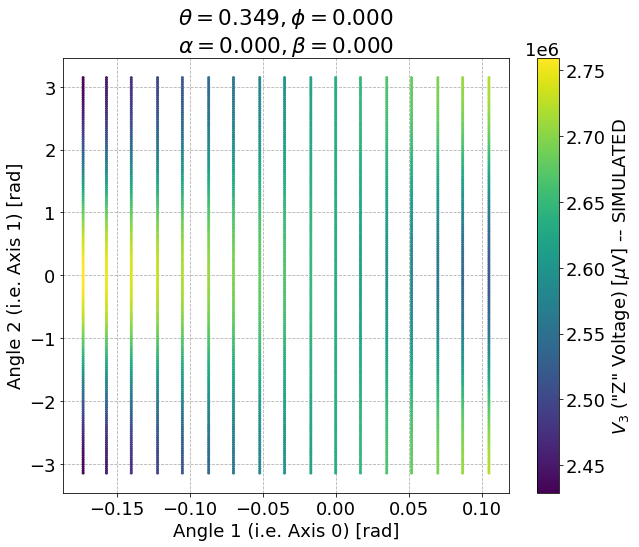

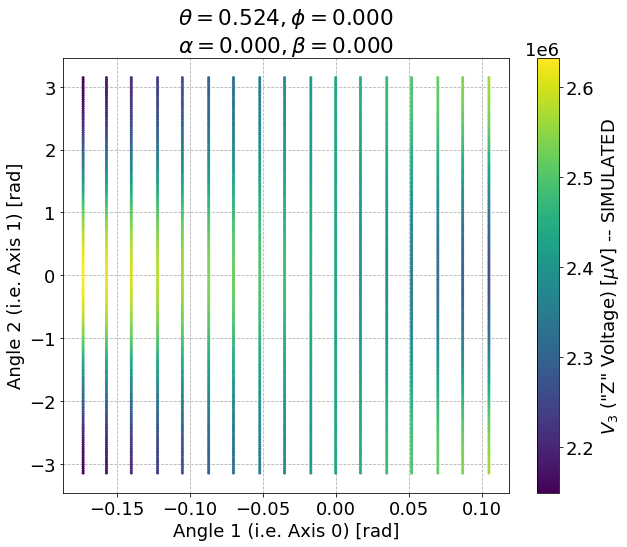

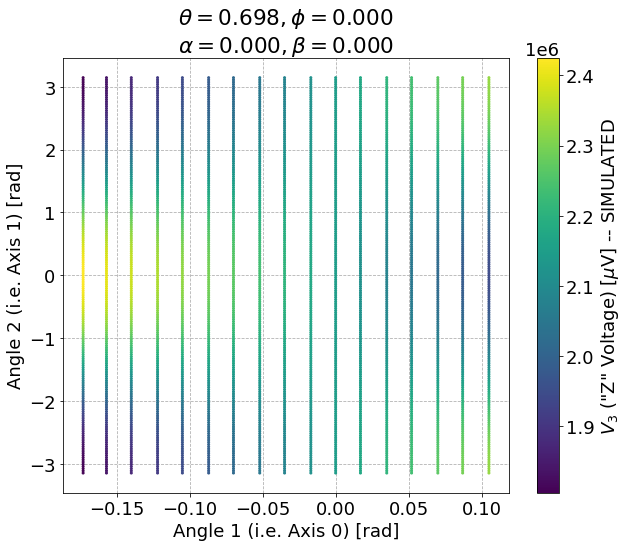

...

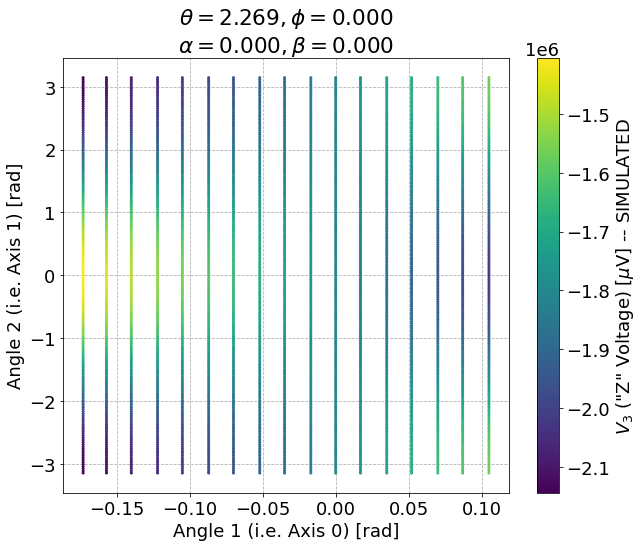

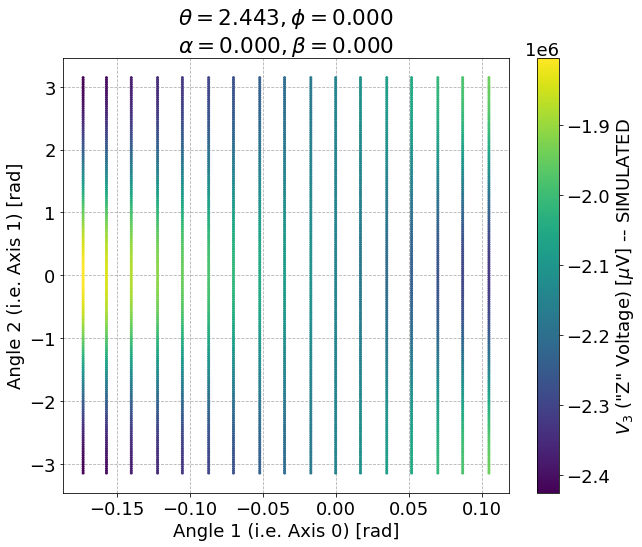

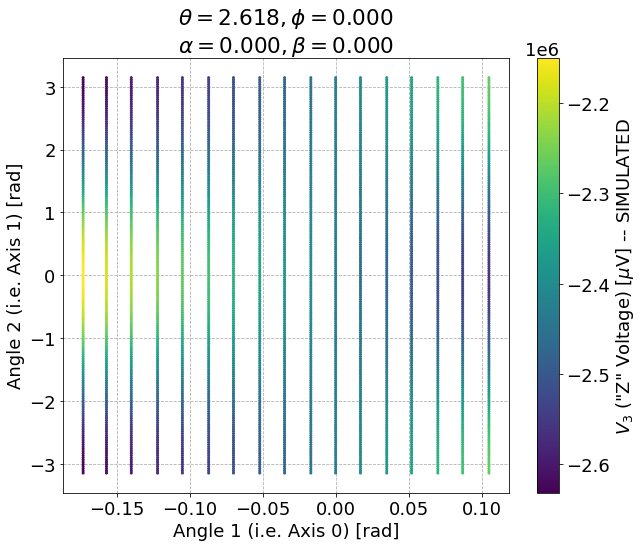

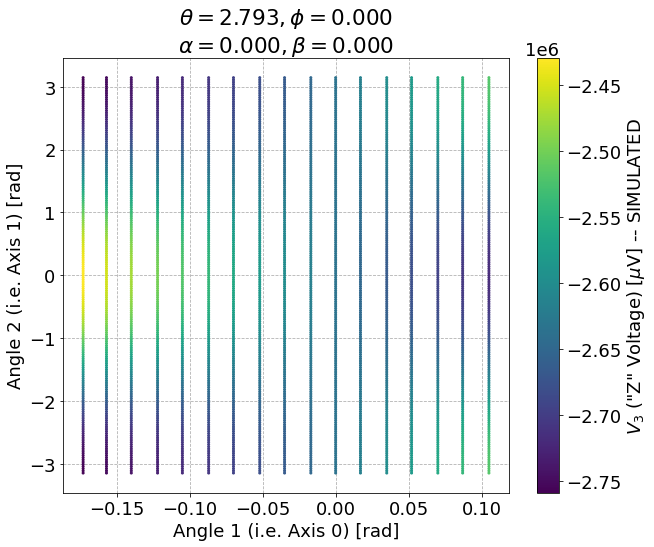

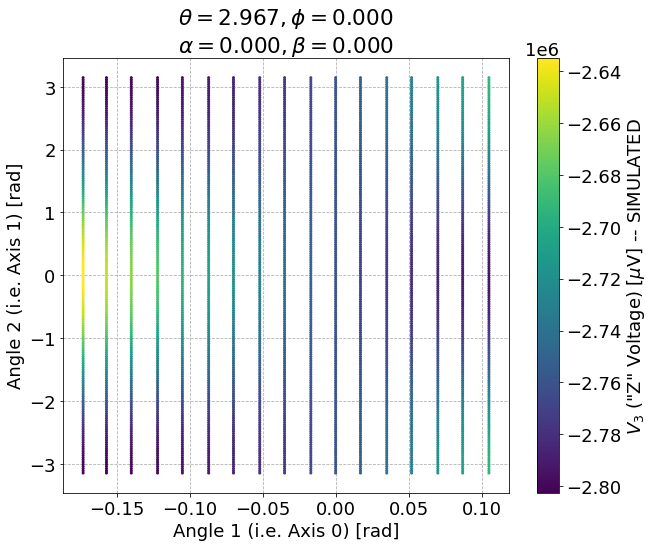

In [446]:
# B aligned perfectly with Kinematic plate
# theta dependence (phi = 0)
thetas = np.arange(0., 180., 10.)
# phis = [0., 45., 60., 90., 1]
for theta in thetas:
    params = {
        'Vmax': 2802521.0, # ~2e6
        'verbose': 0,
        'theta': np.radians(theta),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': 0.,
        'alpha': 0.,
        'beta': 0.
    }
    ax0s = np.unique(np.round(a1, 3))
    ax1s = np.unique(np.round(a2, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
    Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
    cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

### Fitting

- See if fit for a single Hall element can constrain all four parameters.
- Since we can physically see the Hall elements, SmarAct in the magnet, approximate field direction, we can be smart about initial conditions and limits, if it turns out it there are many minima.
- If it is not possible, may need to combine Hall elements, or combine measurements from different Hall probes (this would be a reason to do a second Hall probe angular scan ASAP).

In [472]:
ax0s = np.unique(np.round(a1, 3))
ax1s = np.unique(np.round(a2, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [484]:
# generate data, with noise
V0 = 2802521.0
sigma = 2.8e3
params_true = {
        'Vmax': V0, # ~2e6
        'verbose': 0,
        'theta': np.random.uniform(low=0., high=np.pi),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.random.uniform(low=-np.pi, high=np.pi),
        'alpha': np.random.uniform(low=0., high=np.radians(12.)),
        'beta': np.random.uniform(low=-np.pi, high=np.pi)
}
Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params_true) for a0, a1 in zip(A0.flatten(), A1.flatten())])
Vs_meas = Vs + np.random.normal(loc=0, scale=sigma, size=len(Vs)) # ~0.1% noise

In [474]:
params_true

{'Vmax': 2802521.0,
 'verbose': 0,
 'theta': 1.2188028694136566,
 'phi': -0.29895587541492263,
 'alpha': 0.06519873665258026,
 'beta': 1.0464908545684297}

In [475]:
Vs, Vs_meas

(array([ 475565.13881303,  465355.59559035,  455732.76578532, ...,
        1192671.63580684, 1190079.82749523, 1187208.85116683]),
 array([ 473866.46388139,  464639.30801628,  453729.74641084, ...,
        1194707.96285734, 1191991.85020984, 1188015.04374204]))

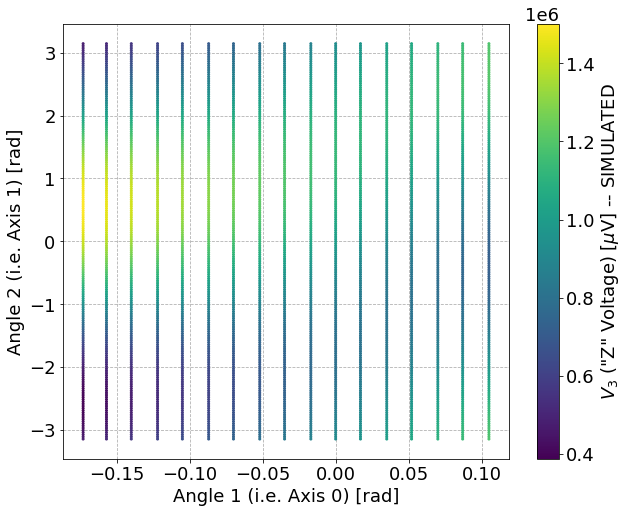

In [476]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

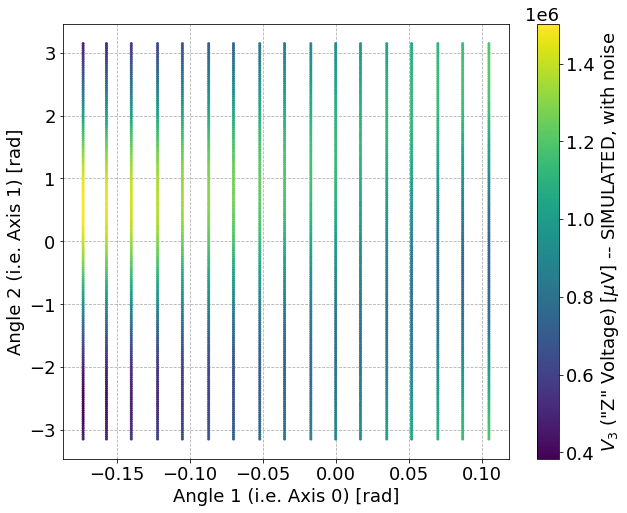

In [477]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs_meas, s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED, with noise')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [492]:
# fit!
model = lm.Model(Hall_Voltage_gen_v1, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
##params.add('Vmax', value=V0, vary=False)
params.add('Vmax', value=V0, vary=True)
# params.add('Vmax', value=V0, vary=True, min=0.99*V0, max=1.01*V0)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0., max=np.pi)
params.add('phi', value=0., min=-np.pi, max=np.pi)
params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.))
params.add('beta', value=0., min=-np.pi, max=np.pi)
# run fit
result = model.fit(Vs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
                   params=params, weights=1/(sigma*np.ones_like(Vs_meas)), scale_covar=False)

In [493]:
V0

2802521.0

In [494]:
result

In [495]:
params_true

{'Vmax': 2802521.0,
 'verbose': 0,
 'theta': 1.2421892127405032,
 'phi': -2.3632259587827007,
 'alpha': 0.10578252091071806,
 'beta': 1.1764629259498438}

### Fit on real data!

In [496]:
V0 = df[f'{probe}_Raw_Z'].abs().max()

In [497]:
V0

2802521.0

In [613]:
sigma_est = 3e-5
# sigma_est = 1e-3
coord = 'Z'
# coord = 'X'
# coord = 'Y'
V0 = df[f'{probe}_Raw_{coord}'].abs().max()
Vs_meas = df[f'{probe}_Raw_{coord}'].values
# fit!
model = lm.Model(Hall_Voltage_gen_v1, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
# params.add('Vmax', value=V0, vary=False)
params.add('Vmax', value=V0-623.56, vary=False) # adjustment from mean of deviations when using V0 (non-varying) 
# params.add('Vmax', value=V0, vary=True)
# params.add('Vmax', value=V0, vary=True, min=V0)
# params.add('Vmax', value=V0, vary=True, min=0.99*V0, max=1.01*V0)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0., max=np.pi)
params.add('phi', value=0., min=-np.pi, max=np.pi)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.))
params.add('beta', value=0., min=-np.pi, max=np.pi)
# best fit alpha and beta
# params.add('alpha', value=0.03240273, vary=False)
# params.add('beta', value=-3.14159265, vary=False)
# phi for X (really Y)
if coord == 'X':
    params.add('phi', value=-np.pi/2, vary=True, min=-np.pi/2 + np.radians(-10), max=-np.pi/2 + np.radians(10))
# phi for Y (really X)
if coord == 'Y':
    params.add('phi', value=0., vary=True, min=np.radians(-10), max=np.radians(10))

# run fit
result = model.fit(Vs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
                   params=params, weights=1/(sigma_est*V0*np.ones_like(Vs_meas)), scale_covar=False)

In [614]:
result

In [615]:
# V_1 (X), but I would call it Y
result

In [535]:
np.degrees(1.5012)

86.01242420503918

In [543]:
np.degrees(1.5010)

86.00096504913655

In [539]:
# V_1 (Y)
result

In [537]:
np.degrees(1.6274)

93.24315157959018

In [540]:
np.degrees(1.6276)

93.25461073549279

In [571]:
# V_3 (Z)
result

In [551]:
np.degrees(result.params['theta'])

180.0

In [552]:
np.degrees(result.params['phi'])

-16.449969756154026

In [553]:
np.degrees(result.params['alpha'])

1.8565396737019377

In [554]:
np.degrees(result.params['beta'])

-179.99999979432002

- All values look about like what I expected! Great!
- As a consistency check, should run a fit like this for all probes going through calibration. If alpha, beta are consistent, it may be helpful to fix these to the "known" values.
- Can also check consistency with V_1 and V_2
- Ultimately, there is one final step, which is to take these parameters and

In [567]:
result.best_fit

array([-2774867.05307524, -2774867.05307524, -2774867.05307524, ...,
       -2776107.48352661, -2776107.48352661, -2776107.48352661])

In [556]:
# plots!
from matplotlib.colors import Normalize
import matplotlib.cm as cm

In [616]:
Vmin = np.min([np.min(df[f'{probe}_Raw_{coord}']), np.min(result.best_fit)])
Vmax = np.max([np.max(df[f'{probe}_Raw_{coord}']), np.max(result.best_fit)])

In [617]:
Vmin, Vmax

(-2802521.0, -2762270.0)

Text(0.5, 1.0, 'Best Fit Values: \n$\\theta = 3.116,\\ \\phi = -3.063$, $\\alpha = 0.032,\\ \\beta = -3.142$')

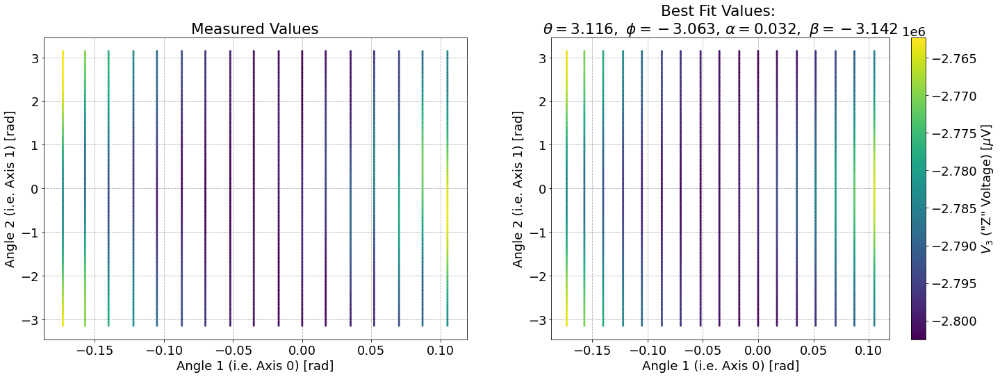

In [618]:
# data, fit
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 8))
cmap = cm.get_cmap('viridis')
normalizer = Normalize(Vmin, Vmax)
im = cm.ScalarMappable(norm=normalizer)
sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Vs_meas, s=4, cmap=cmap, norm=normalizer)
sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

cb = fig.colorbar(im, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

axs[0].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[0].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[0].set_title('Measured Values')
axs[1].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[1].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[1].set_title('Best Fit Values: \n'+
                 rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
                 rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f}$')

In [619]:
### ADD TO DATA PROCESSING!!! FIXME!
# interpolate NMR
# set time from temp file
df['seconds_delta'] = (df.index - df_temp.index[0]).total_seconds()
df['hours_delta'] = (df.index - df_temp.index[0]).total_seconds()/60**2
df['days_delta'] = (df.index - df_temp.index[0]).total_seconds()/(24*60**2)
nmr_interp = interp1d(df_temp.seconds_delta, df_temp["NMR [T]"])
nmr_vals = nmr_interp(df['seconds_delta'])
df.loc[:, 'NMR [T]'] = nmr_vals

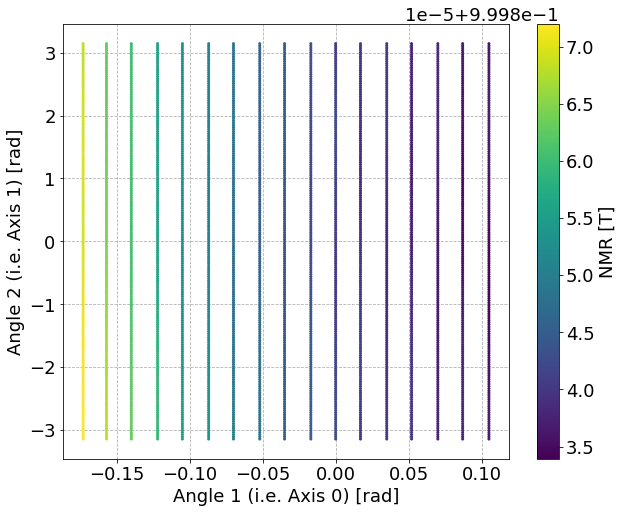

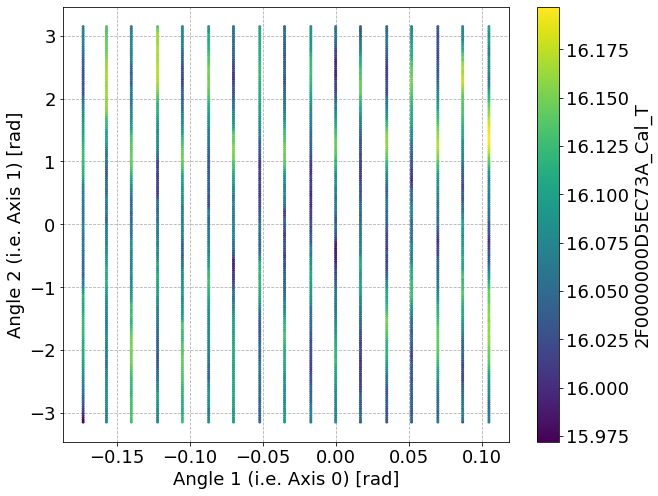

In [620]:
# check NMR and temp stability
for col in ['NMR [T]', f'{probe}_Cal_T']:
    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=df[col], s=4);
    cb = fig.colorbar(sc, label=col)

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [621]:
result.params['theta'].value

3.116299308506676

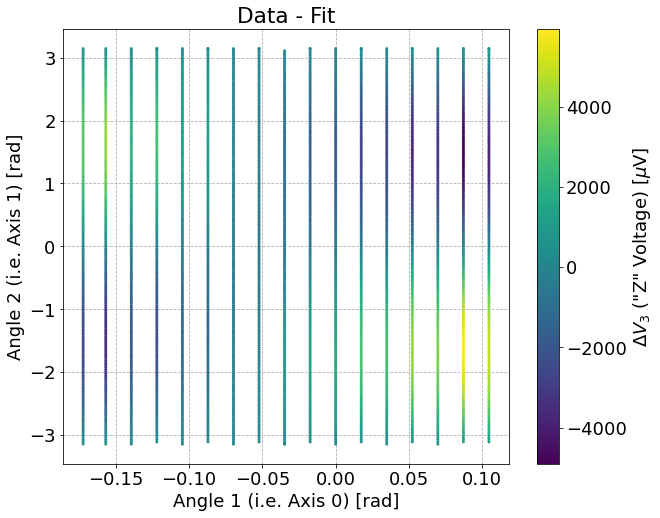

In [622]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Vs_meas - result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data - Fit');

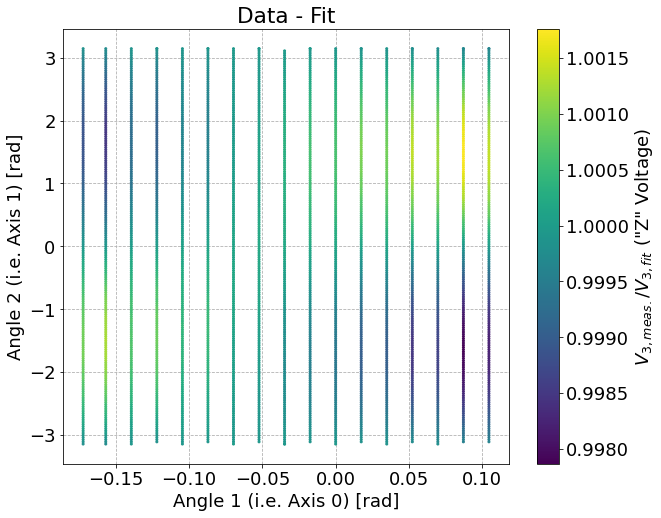

In [623]:
# data / fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Vs_meas / result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$V_{3, meas.} / V_{3, fit}$ ("Z" Voltage)')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data - Fit');

In [624]:
# histograms

In [625]:
len(Vs_meas)

3077

Text(0.5, 0, 'Data - Fit [$\\mu$V]')

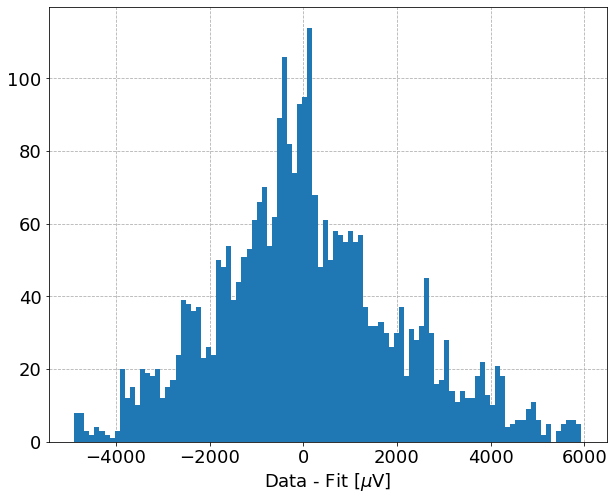

In [626]:
fig, ax = plt.subplots()

ax.hist(Vs_meas - result.best_fit, bins=100)

ax.set_xlabel(r'Data - Fit [$\mu$V]')

In [627]:
np.mean(Vs_meas - result.best_fit), np.std(Vs_meas - result.best_fit, ddof=1)

(101.84689221405392, 1995.665424297942)

Text(0.5, 0, 'Data / Fit')

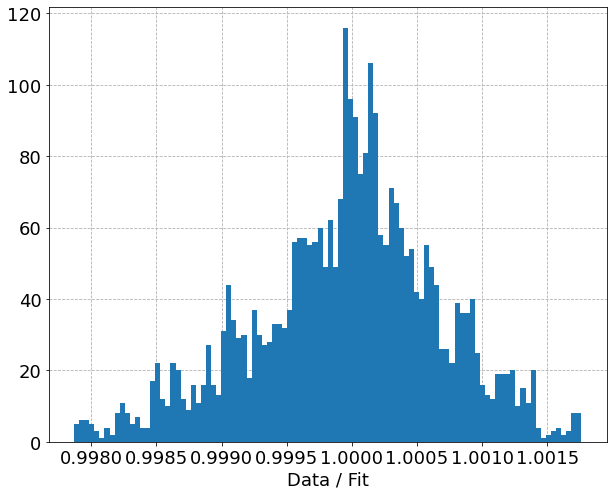

In [630]:
fig, ax = plt.subplots()

ax.hist(Vs_meas / result.best_fit, bins=100)

ax.set_xlabel(r'Data / Fit')

In [631]:
np.mean(Vs_meas / result.best_fit), np.std(Vs_meas / result.best_fit, ddof=1)

(0.9999632752692885, 0.000716717700011333)

# To Do:

- Look back at old angular data and analysis to see if I was anywhere close to correct, in comparison to now.
- Make similar plots to the past: Voltage vs. time (with fit), etc.
- Make the histograms nicer (add stats box)
- Function to go from fit parameters to extracting $\theta, \phi$ from axis 0, axis 1 setttings.
- Rerun the fit from above using the "Cal_X" value (really Bz).
    - From these parameters, which describe the orientation of Bergsma's coordinate system w.r.t. kinematic plate, we have two options
        1. Combine these parameters with previous to get a "Bergsma $\theta, \phi$" (would be interested how this compares kinematic plate).
        2. Reorient the Bergsma calibration to be aligned with kinematic plate
- Once we have a satisfactory mapping from axis 1, axis 2 to Bergsma $\theta, \phi$, we can do a first assessment of the quality of Bergsma's angular calibration.
    - Show this at the next FMS
    - Also show the above result
- With both voltage (& theta, phi) and Bergsma B (& theta, phi Bergsma), plot using 3D spherical harmonic plot
- Try fitting voltage components with spherical harmonic
- Dig out results from last year of getting |B| from |V|. See how well these values agree
    - 1D histogram
    - 2D scatter with color to look for correlation with angle
- Explore different model functions that could be used to represent angular dependence
    - This may be a mix of different functions. e.g. Maybe spherical harmonics good enough for Z, but not X and Y
- Fit residuals of orientation fit (see above) to spherical harmonics?

- Add code for crude analysis of pole-to-pole, and incorporate it into this analysis.
    - For each available current, take the mean value
    - Create an interpolation function
    - Find some very rough estimate of uncertainty

# Asides:

## Rotation Order / Intrinsic vs. Extrinsic

- Starting with vector in XY plane, at a 45 deg angle. First rotate about Y, 90 deg, then rotate about Z 180 deg. Should give --> (0, - 1/sqrt(2), -1/sqrt(2))
    - Doing only the Y rotation should give (0, 1/sqrt(2), -1/sqrt(2))
    - Doing only the Z rotation should give (-1/sqrt(2), 1/sqrt(2), 0)

In [348]:
B_0 = np.array([1./2.**(0.5), 1./2.**(0.5), 0.])
B_0

array([0.70710678, 0.70710678, 0.        ])

In [367]:
# single rotation
# rot = Rotation.from_euler('y', angles=np.array([90.]), degrees=True)
# rot = Rotation.from_euler('z', angles=np.array([90.]), degrees=True)
# both rotations
rot = Rotation.from_euler('yz', angles=np.array([90., 90.]), degrees=True) # ok
# rot = Rotation.from_euler('YZ', angles=np.array([90., 90.]), degrees=True) # BAD
# rot = Rotation.from_euler('zy', angles=np.array([90., 90.]), degrees=True) # BAD
# rot = Rotation.from_euler('ZY', angles=np.array([90., 90.]), degrees=True) # ok

In [368]:
B_rot = rot.apply(B_0)

In [369]:
B_rot

array([-7.07106781e-01,  3.14018492e-16, -7.07106781e-01])

## Rotation with ND array

# OLD (To Go Through)

In [ ]:
Data

## Determine Probe Numbers

In [112]:
(df_ == df).all().all()

True

## Probe on "left" of glass cube (V_2 = Raw_y)

In [125]:
# HP "vertical", small end pointed towards ceiling

In [116]:
360 - 25

335

In [115]:
df['SmarAct_Meas_Angle_2'].unique()

array([359.999594, 214.999972, 234.999993, 255.000016, 275.000009,
       295.000005, 315.000013, 335.000017, 355.000143,  15.000019,
       214.999978, 355.000008, 334.999996, 314.999979, 295.000012,
       274.999986, 254.99996 , 234.999967, 214.999975, 214.999995,
       235.000017, 255.000013, 275.000008, 295.000018, 315.000024,
       335.00001 , 355.000031,  15.000006, 355.000007, 334.999939,
       314.999983, 294.999966, 274.999977, 254.999961, 234.999964,
       214.999953, 214.999996, 235.00001 , 255.000021, 295.000014,
       315.000014, 355.000012,  14.999998, 214.999968, 355.000015,
       334.999992, 314.999993, 295.000006, 274.999973, 254.999963,
       234.999987, 214.999991, 234.999997, 255.000012, 275.000017,
       315.000005, 335.000006, 355.      ,  15.000012, 214.999955,
       354.999995, 334.999999, 314.99998 , 295.000027, 274.999975,
       254.999981, 234.999975, 214.999944, 235.000002, 255.000008,
       295.000016, 335.000011,  15.000011, 214.999981, 355.000

In [144]:
df_line = df[np.isclose(df['SmarAct_Meas_Angle_2'], 335., atol=1e-2, rtol=1e-2)]

In [145]:
df_line

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],2F0000000D5EC73A_Raw_X,2F0000000D5EC73A_Raw_Y,2F0000000D5EC73A_Raw_Z,2F0000000D5EC73A_Raw_T,2F0000000D5EC73A_Cal_X,...,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta,2F0000000D5EC73A_Raw_Bmag,2F0000000D5EC73A_Raw_Theta,2F0000000D5EC73A_Raw_Phi,2F0000000D5EC73A_Cal_Bmag,2F0000000D5EC73A_Cal_Theta,2F0000000D5EC73A_Cal_Phi
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-08-10 11:49:42,8/10/2021 11:49:42 AM,0.0,0.0,0.0,0.0,-12420.0,145063.0,-1278196.0,17412.0,0.460658,...,-1.0,72.0,0.020000,0.000833,1.286461e+06,3.028176,1.656206,0.463523,1.548366,0.108951
2021-08-10 11:50:48,8/10/2021 11:50:48 AM,0.0,0.0,0.0,0.0,-7944.0,114970.0,-1280911.0,17449.0,0.461808,...,-1.0,138.0,0.038333,0.001597,1.286085e+06,3.051864,1.639783,0.463582,1.551013,0.085243
2021-08-10 11:52:29,8/10/2021 11:52:29 AM,0.0,0.0,0.0,0.0,-6924.0,92728.0,-1282299.0,17478.0,0.462430,...,-1.0,239.0,0.066389,0.002766,1.285666e+06,3.069204,1.645328,0.463584,1.551155,0.067777
2021-08-10 11:53:34,8/10/2021 11:53:34 AM,0.0,0.0,0.0,0.0,-5792.0,70512.0,-1283276.0,17464.0,0.462898,...,-1.0,304.0,0.084444,0.003519,1.285225e+06,3.086516,1.652754,0.463573,1.551390,0.050353
2021-08-10 11:55:15,8/10/2021 11:55:15 AM,0.0,0.0,0.0,0.0,-4773.0,48318.0,-1283838.0,17510.0,0.463227,...,-1.0,405.0,0.112500,0.004687,1.284756e+06,3.103792,1.669260,0.463565,1.551543,0.032962
2021-08-10 11:56:21,8/10/2021 11:56:21 AM,0.0,0.0,0.0,0.0,-3579.0,26069.0,-1284083.0,17456.0,0.463426,...,-1.0,471.0,0.130833,0.005451,1.284353e+06,3.121103,1.707233,0.463565,1.551837,0.015536
2021-08-10 11:58:02,8/10/2021 11:58:02 AM,0.0,0.0,0.0,0.0,-2494.0,3749.0,-1283853.0,17491.0,0.463470,...,-1.0,572.0,0.158889,0.006620,1.283861e+06,3.138085,2.157813,0.463553,1.552049,-0.001938
2021-08-10 11:59:07,8/10/2021 11:59:07 AM,0.0,0.0,0.0,0.0,-1427.0,-18624.0,-1283216.0,17461.0,0.463358,...,-1.0,637.0,0.176944,0.007373,1.283352e+06,3.127038,-1.647268,0.463525,1.552250,-0.019455
2021-08-10 12:00:48,8/10/2021 12:00:48 PM,0.0,0.0,0.0,0.0,-254.0,-40955.0,-1282313.0,17487.0,0.463160,...,-1.0,738.0,0.205000,0.008542,1.282967e+06,3.109665,-1.576998,0.463553,1.552543,-0.036943


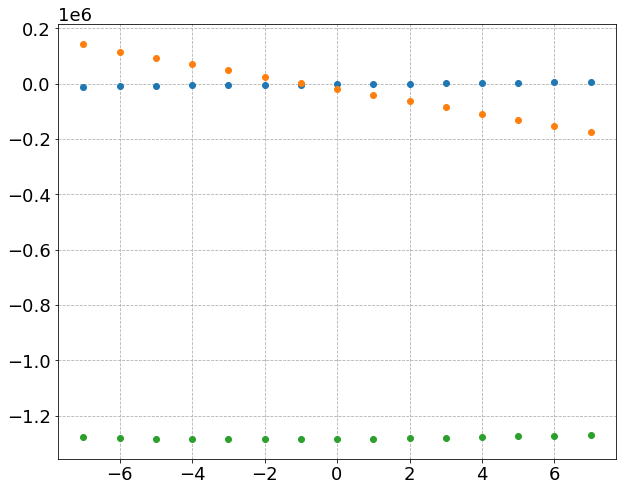

In [146]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_X'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Y'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Z'])

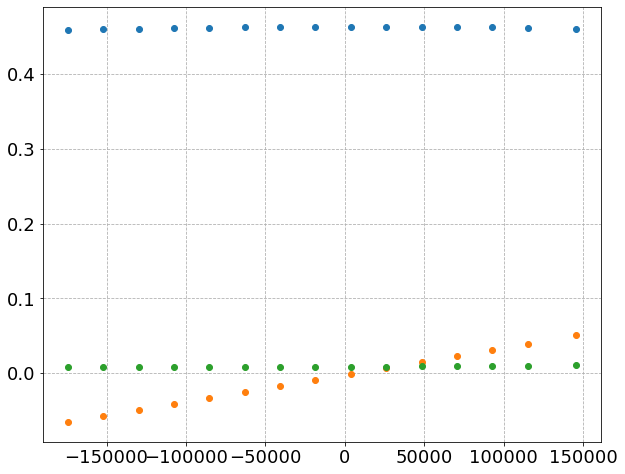

In [148]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line[f'{probe}_Raw_Y'], df_line[f'{probe}_Cal_X'])
ax.scatter(df_line[f'{probe}_Raw_Y'], df_line[f'{probe}_Cal_Y'])
ax.scatter(df_line[f'{probe}_Raw_Y'], df_line[f'{probe}_Cal_Z'])

In [130]:
# HP "horizontal", small end toward "right" (aka Zaber base)
# note don't have exact rotation, within 10 degrees on either end

In [131]:
360 - 25 - 90

245

In [132]:
#(360 - 25 + 90) % 360

In [115]:
df['SmarAct_Meas_Angle_2'].unique()

array([359.999594, 214.999972, 234.999993, 255.000016, 275.000009,
       295.000005, 315.000013, 335.000017, 355.000143,  15.000019,
       214.999978, 355.000008, 334.999996, 314.999979, 295.000012,
       274.999986, 254.99996 , 234.999967, 214.999975, 214.999995,
       235.000017, 255.000013, 275.000008, 295.000018, 315.000024,
       335.00001 , 355.000031,  15.000006, 355.000007, 334.999939,
       314.999983, 294.999966, 274.999977, 254.999961, 234.999964,
       214.999953, 214.999996, 235.00001 , 255.000021, 295.000014,
       315.000014, 355.000012,  14.999998, 214.999968, 355.000015,
       334.999992, 314.999993, 295.000006, 274.999973, 254.999963,
       234.999987, 214.999991, 234.999997, 255.000012, 275.000017,
       315.000005, 335.000006, 355.      ,  15.000012, 214.999955,
       354.999995, 334.999999, 314.99998 , 295.000027, 274.999975,
       254.999981, 234.999975, 214.999944, 235.000002, 255.000008,
       295.000016, 335.000011,  15.000011, 214.999981, 355.000

In [149]:
df_line = df[np.isclose(df['SmarAct_Meas_Angle_2'], 255., atol=1e-2, rtol=1e-2)]

In [150]:
df_line

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],2F0000000D5EC73A_Raw_X,2F0000000D5EC73A_Raw_Y,2F0000000D5EC73A_Raw_Z,2F0000000D5EC73A_Raw_T,2F0000000D5EC73A_Cal_X,...,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta,2F0000000D5EC73A_Raw_Bmag,2F0000000D5EC73A_Raw_Theta,2F0000000D5EC73A_Raw_Phi,2F0000000D5EC73A_Cal_Bmag,2F0000000D5EC73A_Cal_Theta,2F0000000D5EC73A_Cal_Phi
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-08-10 11:49:10,8/10/2021 11:49:10 AM,0.0,0.0,0.0,0.0,-139826.0,-1174.0,-1274535.0,17399.0,0.459784,...,-1.0,40.0,0.011111,0.000463,1.282183e+06,3.032318,-3.133197,0.463607,1.442399,-0.005161
2021-08-10 11:51:20,8/10/2021 11:51:20 AM,0.0,0.0,0.0,0.0,-109934.0,-2997.0,-1277615.0,17539.0,0.461000,...,-1.0,170.0,0.047222,0.001968,1.282339e+06,3.055726,-3.114338,0.463542,1.466236,-0.006731
2021-08-10 11:51:57,8/10/2021 11:51:57 AM,0.0,0.0,0.0,0.0,-88263.0,-6419.0,-1279604.0,17588.0,0.461796,...,-1.0,207.0,0.057500,0.002396,1.282660e+06,3.072544,-3.068995,0.463585,1.483444,-0.009515
2021-08-10 11:54:06,8/10/2021 11:54:06 AM,0.0,0.0,0.0,0.0,-66545.0,-9850.0,-1281034.0,17560.0,0.462379,...,-1.0,336.0,0.093333,0.003889,1.282799e+06,3.089129,-2.994640,0.463554,1.500657,-0.012300
2021-08-10 11:54:44,8/10/2021 11:54:44 AM,0.0,0.0,0.0,0.0,-44770.0,-13293.0,-1282222.0,17600.0,0.462886,...,-1.0,374.0,0.103889,0.004329,1.283072e+06,3.105186,-2.852966,0.463587,1.517907,-0.015091
2021-08-10 11:56:52,8/10/2021 11:56:52 AM,0.0,0.0,0.0,0.0,-23021.0,-16793.0,-1282897.0,17537.0,0.463192,...,-1.0,502.0,0.139444,0.005810,1.283213e+06,3.119385,-2.511364,0.463561,1.535118,-0.017926
2021-08-10 11:57:30,8/10/2021 11:57:30 AM,0.0,0.0,0.0,0.0,-1160.0,-20175.0,-1283247.0,17594.0,0.463400,...,-1.0,540.0,0.150000,0.006250,1.283406e+06,3.125846,-1.628230,0.463578,1.552421,-0.020671
2021-08-10 11:59:39,8/10/2021 11:59:39 AM,0.0,0.0,0.0,0.0,20567.0,-23602.0,-1283248.0,17538.0,0.463465,...,-1.0,669.0,0.185833,0.007743,1.283630e+06,3.117202,-0.854004,0.463592,1.569611,-0.023452
2021-08-10 12:00:17,8/10/2021 12:00:17 PM,0.0,0.0,0.0,0.0,42385.0,-27044.0,-1282582.0,17567.0,0.463304,...,-1.0,707.0,0.196389,0.008183,1.283567e+06,3.102412,-0.567933,0.463524,1.586886,-0.026258


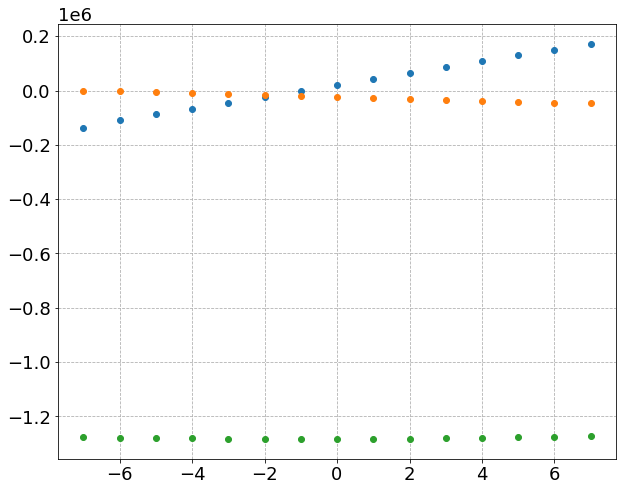

In [151]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_X'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Y'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Z'])

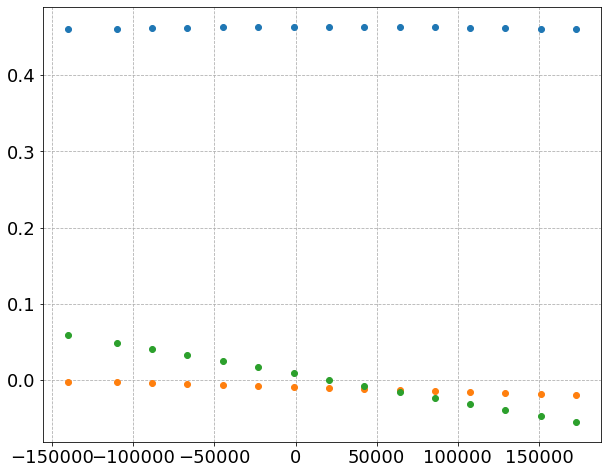

In [152]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line[f'{probe}_Raw_X'], df_line[f'{probe}_Cal_X'])
ax.scatter(df_line[f'{probe}_Raw_X'], df_line[f'{probe}_Cal_Y'])
ax.scatter(df_line[f'{probe}_Raw_X'], df_line[f'{probe}_Cal_Z'])

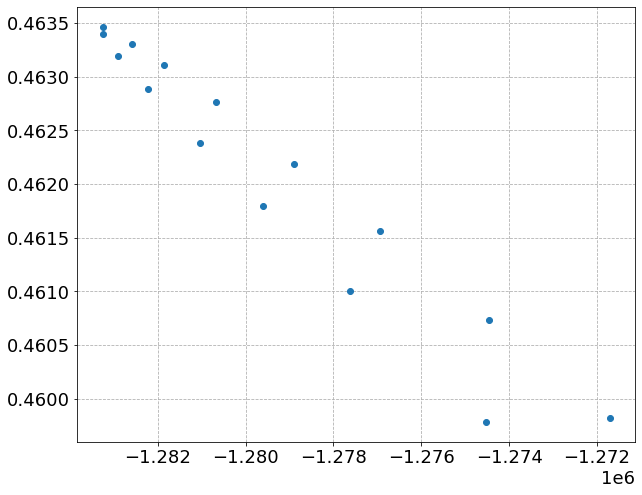

In [154]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line[f'{probe}_Raw_Z'], df_line[f'{probe}_Cal_X'])
# ax.scatter(df_line[f'{probe}_Raw_Z'], df_line[f'{probe}_Cal_Y'])
# ax.scatter(df_line[f'{probe}_Raw_Z'], df_line[f'{probe}_Cal_Z'])

# Positions
- Match up with labels "H1", "H2", "H3" on pictures of green Hall probe card
- "H1" -> "Raw_X", etc.

- Mapping:
    - Raw Z --> -B_z (B_z = B_z on Big Propeller)
    - Raw Y --> B_x (B_x = B_phi on Big Propeller)
    - Raw X --> -B_y (B_y = B_r on Big Propeller)
    
- Bergsma (for comparison):
    - Raw Z --> -B_x
    - Raw Y --> B_y
    - Raw X --> -B_z

In [155]:
probe

'2F0000000D5EC73A'

In [136]:
from hallprobecalib.hpcplots import spherical_scatter3d

In [142]:
# fig = spherical_scatter3d(np.radians(df['SmarAct_Meas_Angle_2']), np.radians(df['SmarAct_Meas_Angle_1']), df[f'{probe}_Raw_Z'])
fig = spherical_scatter3d(3*[df['SmarAct_Meas_Angle_2']], 3*[df['SmarAct_Meas_Angle_1']+2.], [df[f'{probe}_Raw_{i}'] for i in ['X', 'Y', 'Z']],
                         colors_list=['Blues', 'Hot', 'Viridis'])

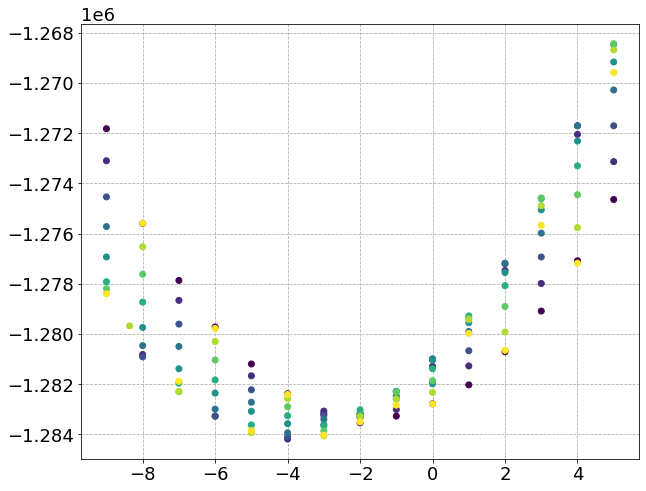

In [224]:
fig, ax = plt.subplots()

a0 = np.radians(df['SmarAct_Meas_Angle_1'])
a0 = np.array([i if i <= np.pi else i-2*np.pi for i in a0])

ax.scatter(np.degrees(a0), df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_2'])

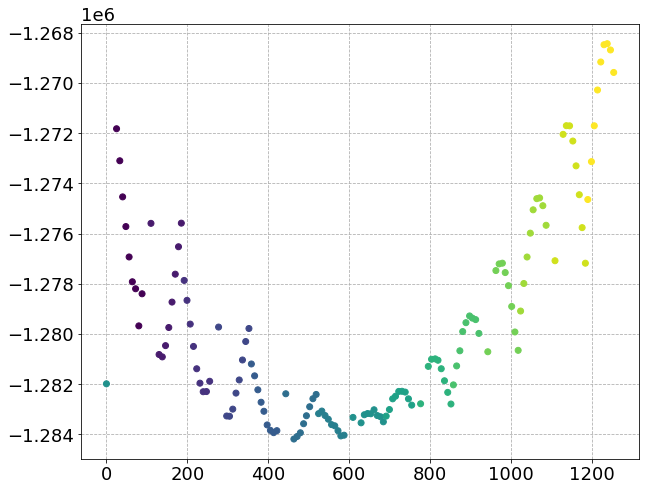

In [160]:
fig, ax = plt.subplots()

ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])

In [197]:
def quad(theta, **params):
    return params['C_0'] + params['C_1'] * theta + params['C_2'] * theta**2

def mod_cos(theta, **params):
    return params['C_0'] + params['C_1'] * np.cos(params['C_2']*theta + params['C_3'])

In [183]:
a1 = np.radians(df['SmarAct_Meas_Angle_1'])
a1 = np.array([i if i <= np.pi else i-2*np.pi for i in a1])
a2 = np.radians(df['SmarAct_Meas_Angle_2'])
a2 = np.array([i if i <= np.pi else i-2*np.pi for i in a2])
df['a1'] = a1
df['a2'] = a2

In [184]:
df_ = df.sort_values(by='a1')

In [185]:
std_V = 2e-5 * df_[f'{probe}_Raw_Z'].values

In [198]:
# model = lm.Model(quad, independent_vars=['theta'])
model = lm.Model(mod_cos, independent_vars=['theta'])
params = lm.Parameters()
params.add('C_0', value=0, vary=False)
params.add('C_1', value=0, vary=True)
# params.add('C_2', value=0, vary=True)
params.add('C_2', value=1, min=0.1, max=2., vary=False)
params.add('C_3', value=0., min=-np.pi, max=np.pi, vary=True)
result = model.fit(df_[f'{probe}_Raw_Z'].values, theta=df_['a1'].values, params=params, weights=1/std_V)

In [199]:
result

In [200]:
np.degrees(result.params['C_3'])

3.0396260339117216

(<Figure size 720x720 with 2 Axes>, GridSpec(2, 1, height_ratios=[1, 4]))

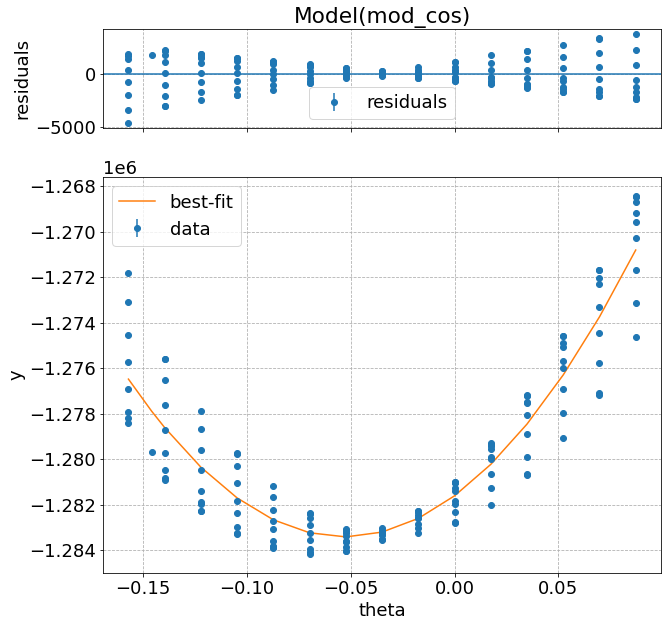

In [201]:
result.plot()

In [161]:
lm

<module 'lmfit' from '/home/ckampa/anaconda3/envs/mu2e/lib/python3.8/site-packages/lmfit/__init__.py'>

In [203]:
res = result.residual

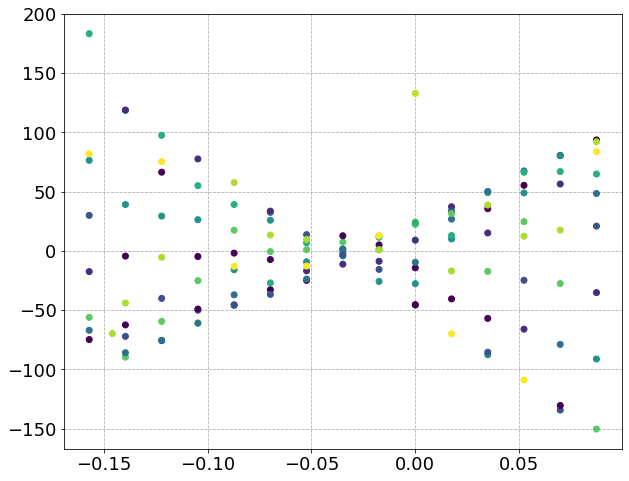

In [209]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df.a1, res, c=df.a2)

In [210]:
res / df[f'{probe}_Raw_Z']

Datetime
2021-08-10 11:48:30   -0.000104
2021-08-10 11:48:55    0.000059
2021-08-10 11:49:03    0.000014
2021-08-10 11:49:10   -0.000024
2021-08-10 11:49:18    0.000053
                         ...   
2021-08-10 12:08:51    0.000072
2021-08-10 12:08:59   -0.000051
2021-08-10 12:09:07    0.000119
2021-08-10 12:09:15   -0.000073
2021-08-10 12:09:23   -0.000066
Name: 2F0000000D5EC73A_Raw_Z, Length: 136, dtype: float64

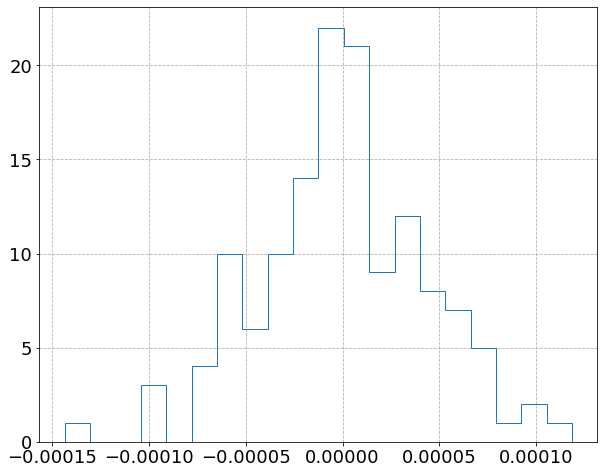

In [212]:
fig,ax =plt.subplots()
ax.hist(res / df[f'{probe}_Raw_Z'], bins=20, histtype='step');

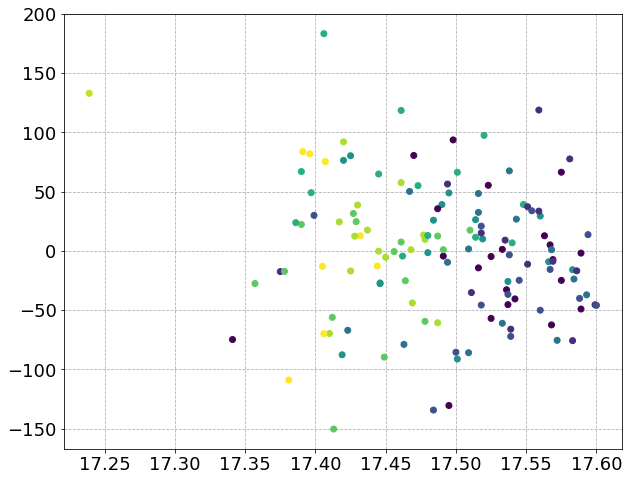

In [213]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df[f'{probe}_Cal_T'], res, c=df.a2)

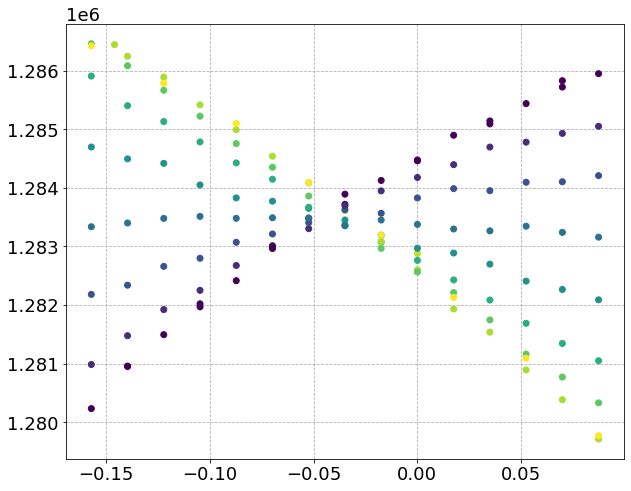

In [214]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df.a1, df[f'{probe}_Raw_Bmag'], c=df.a2)

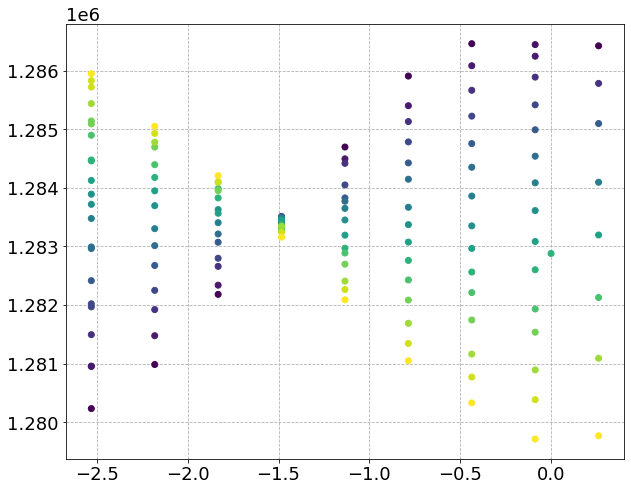

In [216]:
fig, ax = plt.subplots()
ax.scatter(df.a2, df[f'{probe}_Raw_Bmag'], c=df.a1)

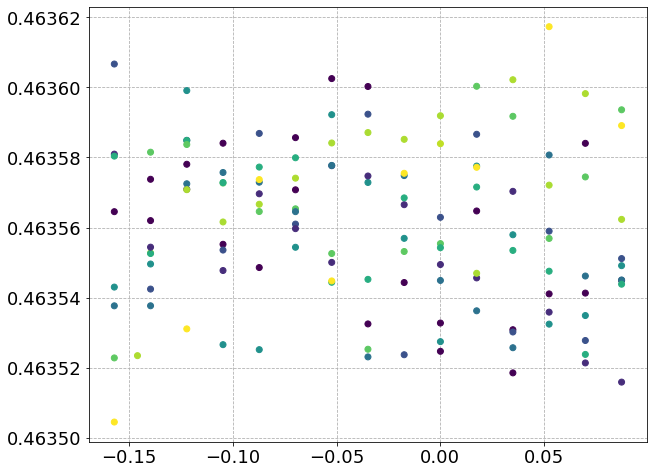

In [217]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df.a1, df[f'{probe}_Cal_Bmag'], c=df.a2)

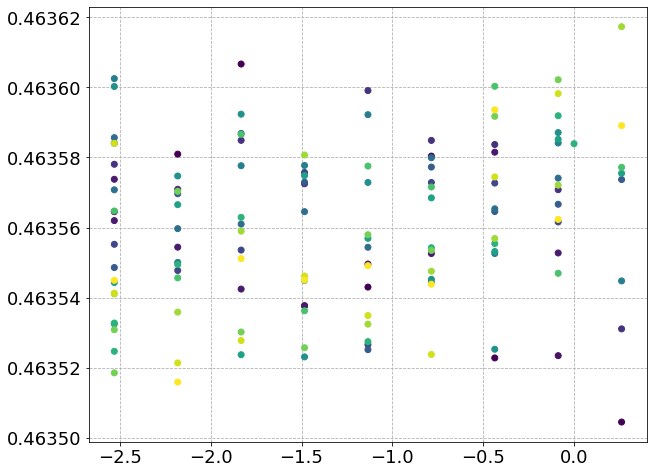

In [218]:
fig, ax = plt.subplots()
ax.scatter(df.a2, df[f'{probe}_Cal_Bmag'], c=df.a1)


In [219]:
df[f'{probe}_Cal_Bmag'].describe()

count    136.000000
mean       0.463561
std        0.000023
min        0.463504
25%        0.463545
50%        0.463562
75%        0.463578
max        0.463617
Name: 2F0000000D5EC73A_Cal_Bmag, dtype: float64

In [221]:
df_temp.query('`NMR [T]` > 0.1')['NMR [T]'].describe()

count    10.000000
mean      0.463524
std       0.000001
min       0.463523
25%       0.463523
50%       0.463523
75%       0.463525
max       0.463525
Name: NMR [T], dtype: float64

In [222]:
df_temp.query('`NMR [T]` > 0.1')['NMR [T]'].mean() - 2e-4

0.4633238055000001

In [223]:
df[f'{probe}_Cal_Bmag'].mean() - (df_temp.query('`NMR [T]` > 0.1')['NMR [T]'].mean() - 2e-4)

0.000236701408483031

# Bergsma Calibration

In [227]:
## ADD THIS TO NOTES / MAIN CODE
df['Bz_Bergsma'] = df[f'{probe}_Cal_X']
df['By_Bergsma'] = df[f'{probe}_Cal_Z']
df['Bx_Bergsma'] = df[f'{probe}_Cal_Y']


In [ ]:
fig, ax = plt.subplots()

a0 = np.radians(df['SmarAct_Meas_Angle_1'])
a0 = np.array([i if i <= np.pi else i-2*np.pi for i in a0])

ax.scatter(np.degrees(a0), df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_2'])